In [18]:
%matplotlib widget

In [20]:
import numpy as np
import scipy as sc
import qutip as q
import matplotlib.pyplot as plt
from numpy import pi
import sympy as sy 
from IPython.display import display, Math
from pylab import rcParams

import Collective_library
from Collective_library import *

import multiprocessing as mp
import concurrent.futures


import scipy.optimize as opt
from random import uniform
from numpy import pi
from functools import partial

import scipy.io as sio

import time

from SphereProba.distributions import VonMisesFisher, Kent
from pathlib import Path
import angle_visualization.triangulation
import seaborn as sns

from tqdm import tqdm
import ipywidgets as widgets

phi = np.linspace(0, pi, 150)
tau = np.linspace(0, 2*pi, 150)
%matplotlib widget
# Basic parameters

N_a = 80 #size of the system
J = build_J(N_a/2) #definition of J operators
vacuum_state = q.basis(N_a + 1, 0) #vacuum state in collective spins, prepared in J_z axis
t_c = 0.003 #cubic interaction power

O = (1j * J['z']**3 * t_c).expm() * J['y'] * (1j * J['z']**3 * t_c).expm() #operator defining cubic squeezing

## Border state variance

### Border state as eigen states of squeezing Hamiltonian $H = \alpha \hat{J}_z^2 + (1 - \alpha) \hat{J}_y^2 + \epsilon \hat{J}_x$

/tmp/ipykernel_25175/488070396.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  var_minimal[i] = Calc_variance_3(minimal_state, t_c, J)


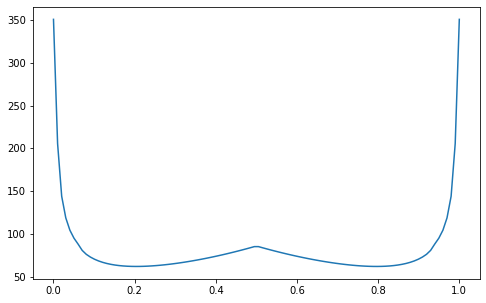

In [3]:
number_of_testing_points = 100

alphas = np.linspace(0,1,number_of_testing_points)
epsilon = -10**-(9)
var_maximal = np.zeros([number_of_testing_points,1])
var_minimal = np.zeros([number_of_testing_points,1])

for i in range(number_of_testing_points):    
    H = alphas[i] * J['z']**2 + (1 - alphas[i]) * J['y']**2 + epsilon * J['x']
    
    l, v = H.eigenstates()
    
    minimal_state = rotation_calibration(v[0], J)
    var_minimal[i] = Calc_variance_3(minimal_state, t_c, J)
    
plt.figure(figsize=(8, 5))
plt.plot(alphas, var_minimal)

In [4]:
number = np.where(min(var_minimal) == var_minimal)[0][0]-1
# number2 = np.where(min(var_maximal[50:99]) == var_maximal)[0][0]

alpha = alphas[number]
print(alpha)
H = alpha * J['z']**2 + (1 - alpha) * J['y']**2 + epsilon * J['x']
l, v = H.eigenstates()

0.787878787878788


(20.000000000000004+0j)
(61.87639685817527+0j)
Quantum object: dims = [[1], [1]], shape = (1, 1), type = bra
Qobj data =
[[2.51822681]]


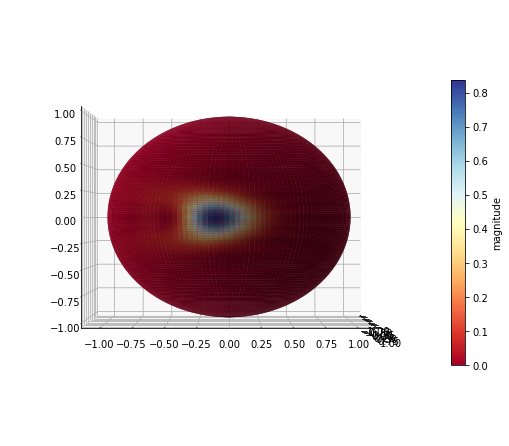

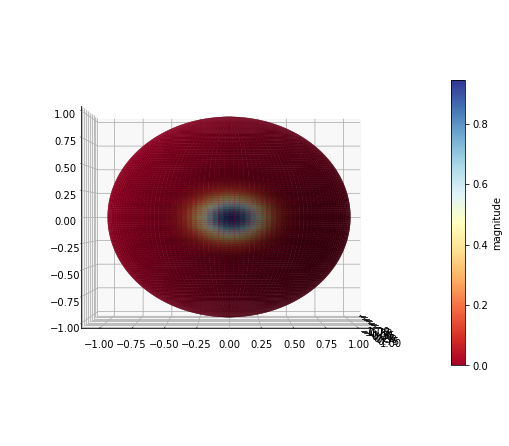

In [13]:
cubic = (1j * t_c * J['z']**3).expm() * (-1j * pi/2 * J['y']).expm() * vacuum_state
print(Calc_variance_3(cubic, t_c, J))

QQ, THETA, PHI = q.spin_q_function(cubic*cubic.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(0,0)

v_lol = rotation_calibration(v[0],J)
print(Calc_variance_3(v_lol, t_c, J))
# O_test_a = J['x'] + t_c * ( J['z']**2 *J['y'] + J['z']*J['y']*J['z'] + J['y']*J['z']**2 ) 
# print((v_lol.dag() * O_test_a**2 * v_lol) - (v_lol.dag() * O_test_a * v_lol)**2)

QQ, THETA, PHI = q.spin_q_function(v_lol*v_lol.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(0,0)

Cov =  q.covariance_matrix([J['y'],J['z']],v_lol*v_lol.dag())

### Border state as eigen states of squeezing Hamiltonian $H = \alpha \hat{J}_z^2 + (1 - \alpha) \hat{J}_y^2 + \beta (\hat{J}_z \hat{J}_y + \hat{J}_y \hat{J}_z) + \epsilon \hat{J}_x $

In [32]:
number_of_testing_points2 = 20
# number_of_testing_points2 = 2

# alphas = np.linspace(0,1,number_of_testing_points)
betas = np.linspace(0.5,0.9,number_of_testing_points2)
epsilon = -10**-(9)

var_minimal = np.zeros([number_of_testing_points2,1])

for j in range(number_of_testing_points2): 
    H = 0.797979797979798 * J['z']**2 + (1 - 0.797979797979798) * J['y']**2  + betas[j]*(J['y']*J['z'] + J['z']*J['y'])  + epsilon * J['x']

    l, v = H.eigenstates()

    minimal_state = rotation_calibration(v[0], J)
    var_minimal[j] = Calc_variance_3(minimal_state, t_c, J)

/tmp/ipykernel_3792880/3465380692.py:16: ComplexWarning: Casting complex values to real discards the imaginary part
  var_minimal[j] = Calc_variance(minimal_state, t_c, J)


In [33]:
number_for_beta = np.where(min(var_minimal) == var_minimal)[0][0]-1

H = 0.797979797979798 * J['z']**2 + (1 - 0.797979797979798) * J['y']**2 + epsilon * J['x'] + betas[number_for_beta]*(J['y']*J['z'] + J['z']*J['y'])  + epsilon * J['x']
l, v = H.eigenstates()
print(Calc_variance(rotation_calibration(v[0], J), t_c, J))



(61.98898993361903+0j)


In [44]:
v_lol = v[0]


QQ, THETA, PHI = q.spin_q_function(v_lol*v_lol.dag(), phi, tau )

W, THETA_W,PHI_W = q.spin_wigner(v_lol*v_lol.dag(), phi, tau)


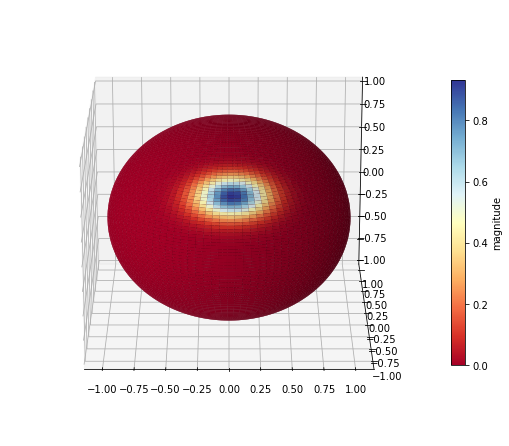

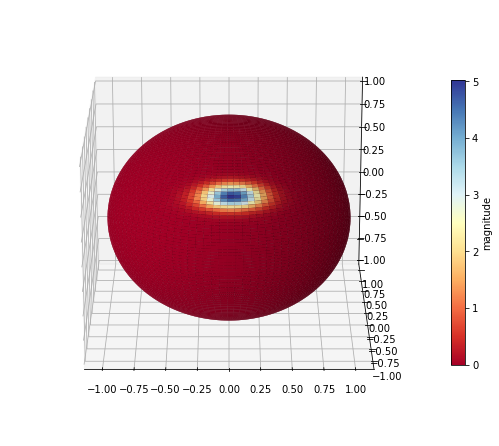

In [46]:
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(20,-90)

fig, ax = q.plot_spin_distribution_3d(W, THETA_W, PHI_W)
ax.view_init(20,-90)

In [ ]:
plt.figure(figsize=(10, 10))
h = plt.contourf( betas, alphas, var_minimal,200)

# plt.axis('scaled')
plt.xlabel('betas')
plt.ylabel('alphas')
plt.colorbar()
plt.show()

### Border state as the state after general quadratick operation

In [35]:
state_x = (1j * J['y'] *pi/2).expm() * vacuum_state

print('Var of coherent state = ', Calc_variance_3(state_x, t_c, J).real)

Var of coherent state =  85.71703029241309


In [3]:
n_points1 = 20
n_points2 = 30

variance = np.zeros([n_points1, n_points2])
rotation = np.linspace(0,pi/3,n_points1)
squeezing = np.linspace(0,0.3,n_points2)
minimumofvariance = np.zeros([n_points1,1])
position = np.zeros([n_points1,1])
states_from_simulation = []
pure_output_state = []

for k in range(n_points1):
    for l in range(n_points2):
        
        testing_state = (1j * J['z']**2 * squeezing[l]).expm() * (1j * J['x'] * rotation[k]).expm() * vacuum_state
        correction = rotation_calibration(testing_state, J)
        variance[k][l] = Calc_variance_3(correction, t_c, J)
        states_from_simulation.append(correction)
        pure_output_state.append(testing_state)
        
    minimumofvariance[k] = min(variance[k])
    position[k] = np.where(min(variance[k]) == variance[k])[0][0]
        

/tmp/ipykernel_3681877/2133365589.py:17: ComplexWarning: Casting complex values to real discards the imaginary part
  variance[k][l] = Calc_variance(correction, t_c, J)


(58.928395487578314+0j)


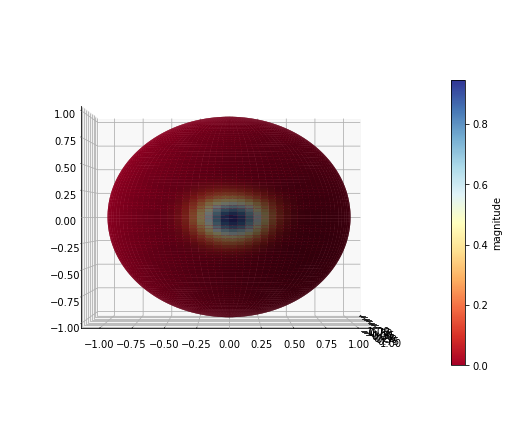

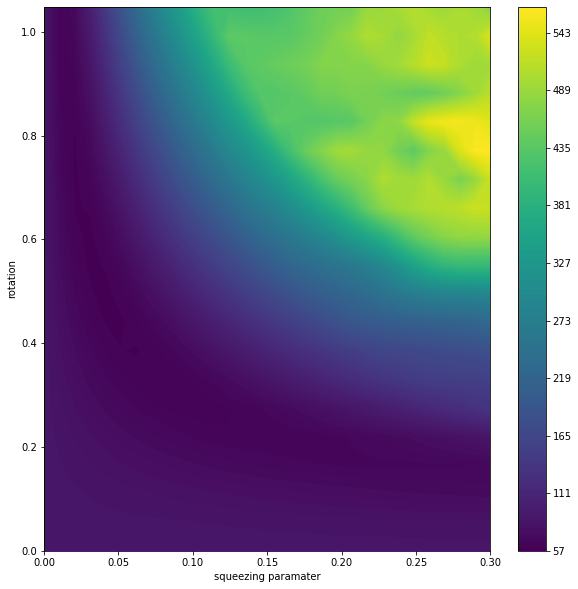

In [16]:
s = rotation_calibration(pure_output_state[min_index], J)

print(Calc_variance(s, t_c, J))
QQ1, THETA, PHI = q.spin_q_function(s*s.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ1, THETA, PHI)
ax.view_init(0,0)

plt.figure(figsize=(10, 10))
h = plt.contourf(squeezing, rotation, variance,200)

# plt.axis('scaled')
plt.xlabel('squeezing paramater')
plt.ylabel('rotation')
plt.colorbar()
plt.show()

### Generation of bloch spheres with random parameters - $\hat{H} = \alpha \hat{J}_y^2 + \beta \hat{J}_z^2 + \gamma \hat{J}_x + \delta \hat{J}_y + \epsilon \hat{J}_z$

In [215]:
a = 0.19549
b = 1 - a 
c = 1
d = -1
e = -0.36016

H = a * J['y']**2 + b * J['z']**2 + c * J['x'] + d * J['y'] + e * J['z']

l, s = H.eigenstates()

t_cc = np.linspace(0,0.1,100)

# state_in_that_way = (-1j * J['x'] * pi/4).expm() * rotation_calibration(s,J)
state_in_that_way = rotation_calibration(s[0],J)
result = np.zeros([100,1])

for tt in range(100):
    result[tt] = Calc_variance_3(state_in_that_way, t_cc[tt], J) 

AttributeError: 'Qobj' object has no attribute 'real'

In [213]:
plt.plot(t_cc, result)

Q0, THETA, PHI = q.spin_q_function(state_in_that_way*state_in_that_way.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(Q0, THETA, PHI)
ax.view_init(0,-90)

NameError: name 'result' is not defined

In [24]:
 q.covariance_matrix([J['y'],J['z']],state_in_that_way*state_in_that_way.dag())

array([[1.74694444e+02, 7.08640603e-13],
       [7.08640603e-13, 7.36407598e+01]])

### Variance for quadratic squeezing - $\hat{H} = \chi \hat{J}_z^2$

/tmp/ipykernel_3836091/1804114974.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  var_minimal[i] = Calc_variance_2(minimal_state, 1/np.sqrt(N_a), J)


0.010101010101010102


/tmp/ipykernel_3836091/1804114974.py:29: ComplexWarning: Casting complex values to real discards the imaginary part
  aha[jaj] = Calc_variance_2(vrot, 1/np.sqrt(N_a), J)


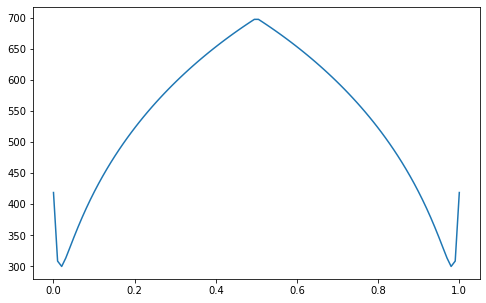

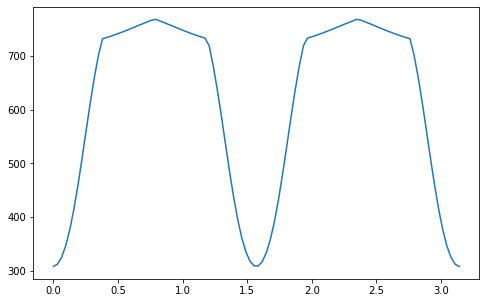

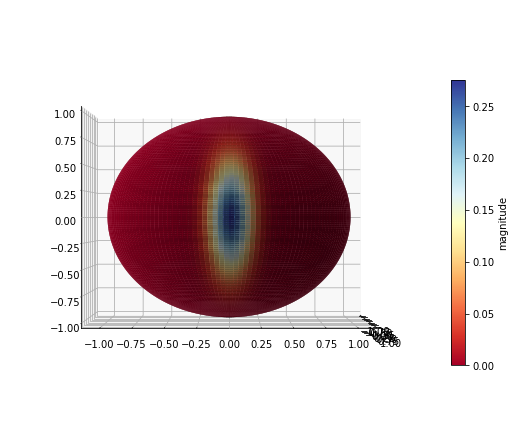

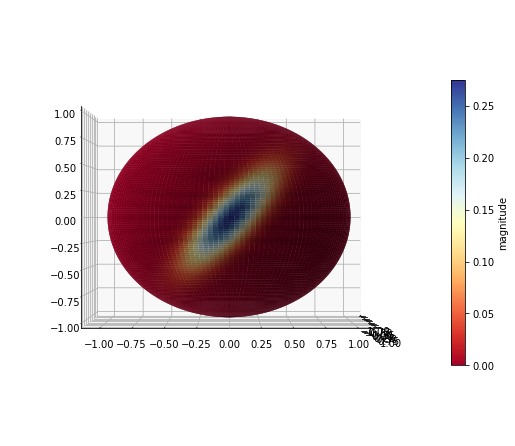

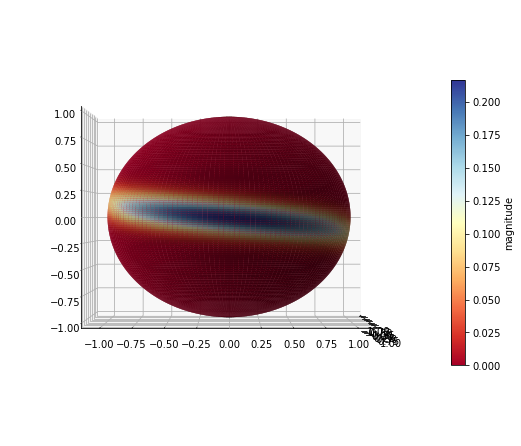

In [73]:
number_of_testing_points = 100

alphas = np.linspace(0,1,number_of_testing_points)
epsilon = -10**-(9)
var_maximal = np.zeros([number_of_testing_points,1])
var_minimal = np.zeros([number_of_testing_points,1])

for i in range(number_of_testing_points):    
    H = alphas[i] * J['z']**2 + (1 - alphas[i]) * J['y']**2 + epsilon * J['x']
    
    l, v = H.eigenstates()
    
    minimal_state = rotation_calibration(v[0], J)
    var_minimal[i] = Calc_variance_2(minimal_state, 1/np.sqrt(N_a), J)
    
plt.figure(figsize=(8, 5))
plt.plot(alphas, var_minimal)

number = np.where(min(var_minimal) == var_minimal)[0][0]-1
alpha = alphas[number]
print(alpha)
H = alpha * J['z']**2 + (1 - alpha) * J['y']**2 + epsilon * J['x']
l, v = H.eigenstates()

aha = np.zeros([100,1])
rotace = np.linspace(0,pi,100)
for jaj in range(100):
    vrot =  (1j * J['x'] * rotace[jaj]).expm() * v[0]
    aha[jaj] = Calc_variance_2(vrot, 1/np.sqrt(N_a), J)

plt.figure(figsize=(8, 5))
plt.plot(rotace,aha)


Q_bor, THETA, PHI = q.spin_q_function(v[0]*v[0].dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(Q_bor, THETA, PHI)
ax.view_init(0,0)

vrot = (1j * J['x'] * 2.4802047265182576).expm() * v[0]

Q_bor, THETA, PHI = q.spin_q_function(vrot*vrot.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(Q_bor, THETA, PHI)
ax.view_init(0,0)

vrot2 = (-1j * J['y'] * pi/2).expm() * (1j * J['x']**2 *1/np.sqrt(N_a)).expm() * vacuum_state

Q_bor, THETA, PHI = q.spin_q_function(vrot2*vrot2.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(Q_bor, THETA, PHI)
ax.view_init(0,0)

In [76]:
print(Calc_variance_2(vrot2,1/np.sqrt(N_a),J))

gamma = np.linspace(0,pi,20)

for rotrot in range(20):
    print(gamma[rotrot])
    print(Calc_variance_2((1j * J['x'] * gamma[rotrot]).expm() * v[0],1/np.sqrt(N_a),J))
    print('\n')

(19.999999999999755+0j)
0.0
(308.6809711368933+0j)


0.16534698176788384
(423.7420788764059+0j)


0.3306939635357677
(678.0289677481595+0j)


0.4960409453036515
(740.7270516793399+0j)


0.6613879270715354
(756.5177719356021+0j)


0.8267349088394192
(764.5230500425332+0j)


0.992081890607303
(748.3757054388047+0j)


1.1574288723751869
(733.9856082292235+0j)


1.3227758541430708
(551.8385616571728+0j)


1.4881228359109546
(337.4035906500195+0j)


1.6534698176788385
(337.4035906500206+0j)


1.8188167994467224
(551.8385616571749+0j)


1.984163781214606
(733.9856082292206+0j)


2.14951076298249
(748.3757054388059+0j)


2.3148577447503738
(764.5230500425349+0j)


2.4802047265182576
(756.5177719356018+0j)


2.6455517082861415
(740.7270516793369+0j)


2.8108986900540254
(678.0289677481629+0j)


2.9762456718219092
(423.7420788764047+0j)


3.141592653589793
(308.68097113689316+0j)




In [62]:
q.covariance_matrix([J['y'],J['z']],vrot*vrot.dag())

array([[  1.72520042,   0.        ],
       [  0.        , 204.3726034 ]])

In [63]:
q.covariance_matrix([J['y'],J['z']],v[0]*v[0].dag())

array([[  1.72520042,   0.        ],
       [  0.        , 204.3726034 ]])

In [57]:
print(min(var_minimal))
print(min(aha))

[300.04698449]
[308.68097114]


/tmp/ipykernel_3843061/4146271109.py:25: ComplexWarning: Casting complex values to real discards the imaginary part
  var_minimal[i] = Calc_variance_3(minimal_state, t_q[time_squeezing], J)
/tmp/ipykernel_3843061/4146271109.py:29: ComplexWarning: Casting complex values to real discards the imaginary part
  var_squeezed_state[0][i] = (Calc_variance_3(v_sq, t_q[time_squeezing], J))
/tmp/ipykernel_3843061/4146271109.py:37: ComplexWarning: Casting complex values to real discards the imaginary part
  var_border[0][time_squeezing] = Calc_variance_3(v_lol, t_q[time_squeezing], J)
/tmp/ipykernel_3843061/4146271109.py:42: ComplexWarning: Casting complex values to real discards the imaginary part
  var_sq_state[0][time_squeezing] = Calc_variance_3(vv_sq, t_q[time_squeezing], J)
/tmp/ipykernel_3843061/4146271109.py:44: RuntimeWarning: divide by zero encountered in double_scalars
  parameter[0][time_squeezing] = var_sq_state[0][time_squeezing]/var_border[0][time_squeezing]


var_sq =  19.999999999999982
var_bor =  0.0






var_sq =  21.171876307843316
var_bor =  14.36406606594986






var_sq =  24.611783838088193
var_bor =  22.855969065916376






var_sq =  30.103878497928307
var_bor =  30.260839737309






var_sq =  37.32325347030073
var_bor =  36.54944693705399






var_sq =  45.879155142993554
var_bor =  42.318974858596164






var_sq =  55.36084665902164
var_bor =  47.876860829763544






var_sq =  65.37771725007045
var_bor =  53.09738122754079






var_sq =  75.58836742117612
var_bor =  57.37527199637171






var_sq =  85.7170302924132
var_bor =  61.99646032503415








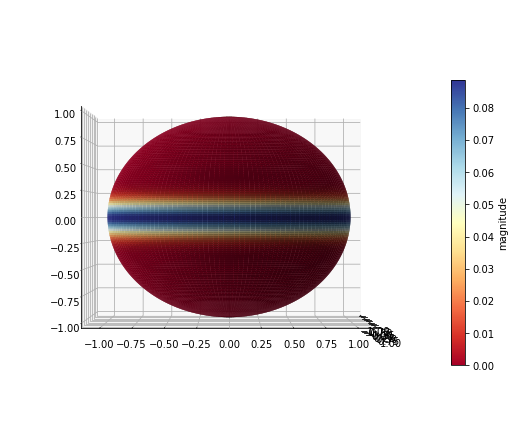

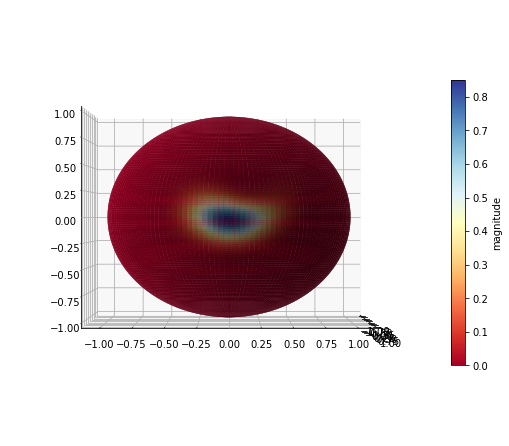

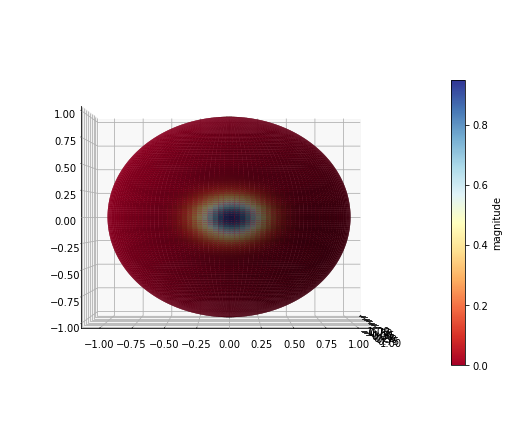

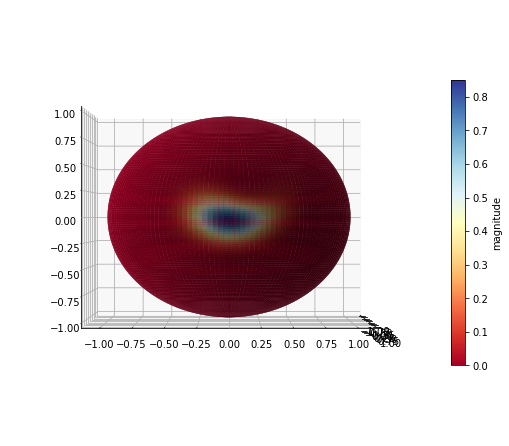

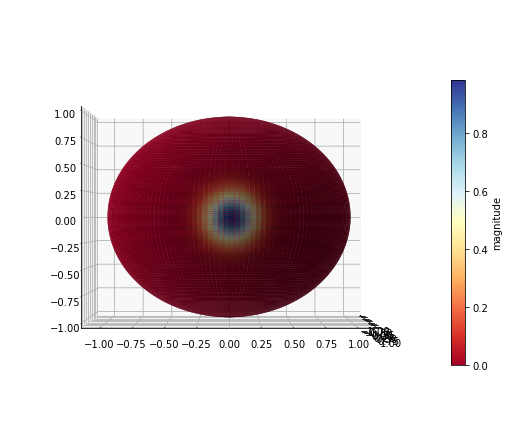

...

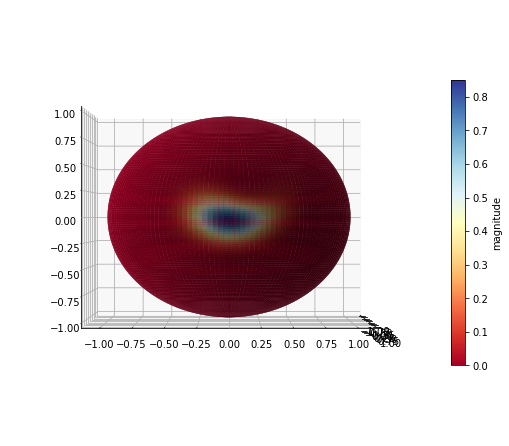

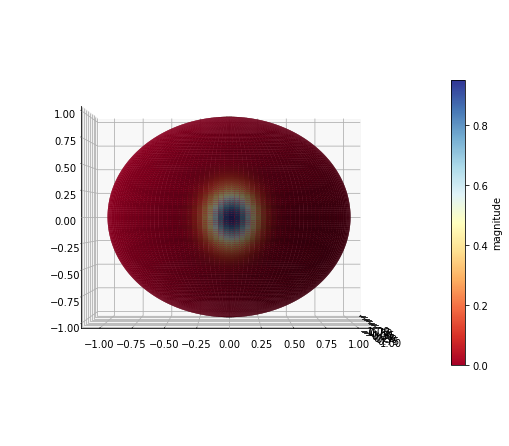

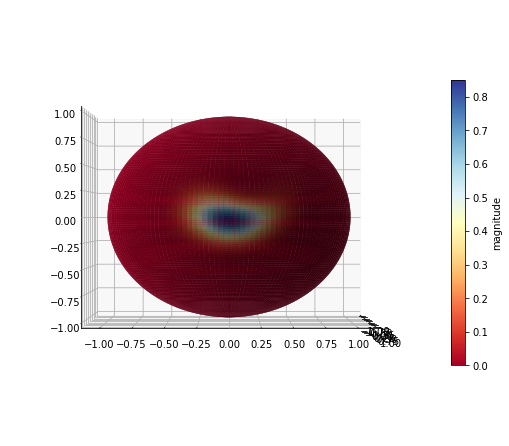

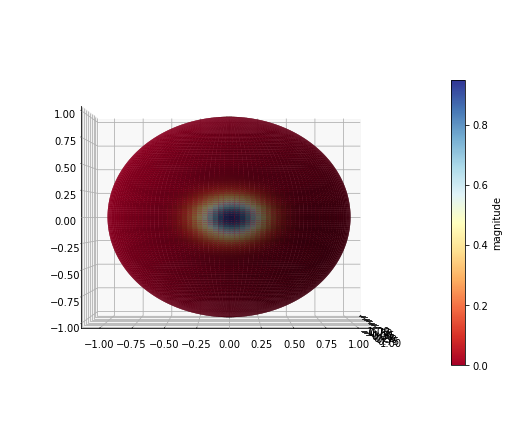

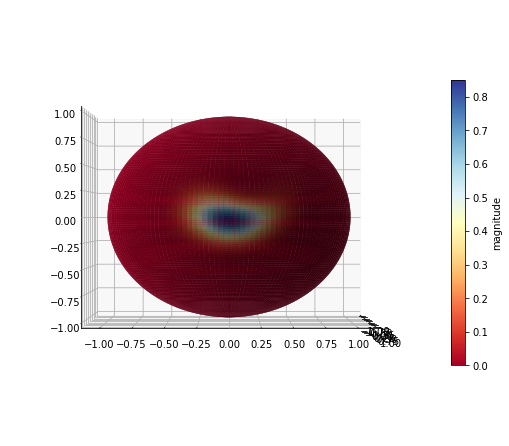

In [25]:
number_of_testing_points = 10
t_q = np.linspace(0,0.003,number_of_testing_points)


alphas = np.linspace(10**(-7),1,number_of_testing_points)
g = np.linspace(0,1/np.sqrt(N_a),number_of_testing_points)
epsilon = -10**-(9)

var_border = np.zeros([1,number_of_testing_points])
var_squeezed_state = np.zeros([1,number_of_testing_points])
var_sq_state = np.zeros([1,number_of_testing_points])
parameter = np.zeros([1,number_of_testing_points])

for time_squeezing in range(number_of_testing_points):   

    var_maximal = np.zeros([number_of_testing_points,1])
    var_minimal = np.zeros([number_of_testing_points,1])

    for i in range(number_of_testing_points):    
        H = alphas[i] * J['z']**2 + (1 - alphas[i]) * J['y']**2 + epsilon * J['x']

        l, v = H.eigenstates()

        minimal_state = rotation_calibration(v[0], J)
        var_minimal[i] = Calc_variance_3(minimal_state, t_q[time_squeezing], J)
        
        squeezed_state =  (1j * J['z']**2 * g[i]).expm() * (1j * J['x'] * pi/8).expm()  * vacuum_state
        v_sq = rotation_calibration(squeezed_state,J)
        var_squeezed_state[0][i] = (Calc_variance_3(v_sq, t_q[time_squeezing], J))
        
    number = np.where(min(var_minimal) == var_minimal)[0][0]

    alpha = alphas[number]
    H = alpha * J['z']**2 + (1 - alpha) * J['y']**2 + epsilon * J['x']
    l, v = H.eigenstates()
    v_lol = rotation_calibration(v[0],J)
    var_border[0][time_squeezing] = Calc_variance_3(v_lol, t_q[time_squeezing], J)
    
    number_sq = np.where(min(var_squeezed_state) == var_squeezed_state)[0][0]
    sq_state =  (1j * J['z']**2 * g[number_sq]).expm() * (1j * J['x'] * pi/8).expm()  * vacuum_state
    vv_sq = rotation_calibration(sq_state,J)
    var_sq_state[0][time_squeezing] = Calc_variance_3(vv_sq, t_q[time_squeezing], J)

    parameter[0][time_squeezing] = var_sq_state[0][time_squeezing]/var_border[0][time_squeezing]
    
    print('var_sq = ', var_sq_state[0][time_squeezing])
    print('var_bor = ', var_border[0][time_squeezing])
    print('\n')
    Q_bor, THETA, PHI = q.spin_q_function(v_lol*v_lol.dag(), phi, tau )
    fig, ax = q.plot_spin_distribution_3d(Q_bor, THETA, PHI)
    ax.view_init(0,0)
    Q_sq, THETA, PHI = q.spin_q_function(v_sq*v_sq.dag(), phi, tau )
    fig, ax = q.plot_spin_distribution_3d(Q_sq, THETA, PHI)
    ax.view_init(0,0)
    print('\n')
    print('\n')

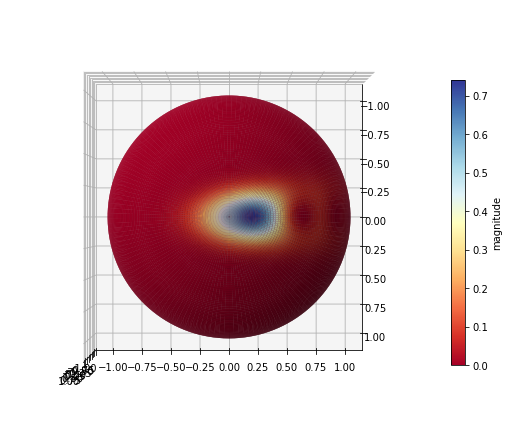

In [15]:
Q_sq, THETA, PHI = q.spin_q_function( ((1j * J['x']**3 * 0.005).expm() * vacuum_state)*((1j * J['x']**3 * 0.005).expm() * vacuum_state).dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(Q_sq, THETA, PHI)
ax.view_init(90,0)

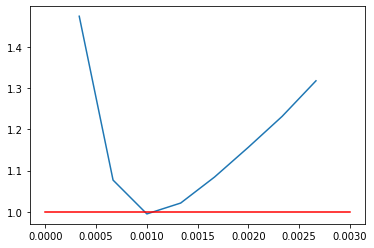

In [24]:
plt.plot(t_q[1:-1],parameter[0][1:-1],t_q,np.ones([1,10])[0],'r');

### Kent distribution

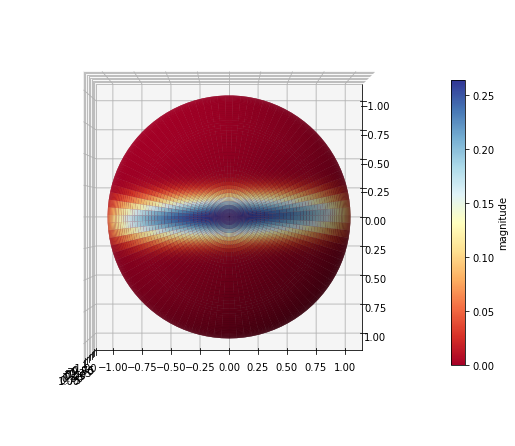

In [3]:
vv =  (1j * 0.025 * (J['x']*J['y'] + J['y']*J['x'])).expm() * vacuum_state
# vv = (1j * J['x'] * pi/2).expm() * vacuum_state
Q0, THETA, PHI = q.spin_q_function(vv*vv.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(Q0, THETA, PHI)
ax.view_init(90,0)

In [4]:
jx = (vv.dag() * J['x'] * vv)[0][0][0].real
jy = (vv.dag() * J['y'] * vv)[0][0][0].real
jz = (vv.dag() * J['z'] * vv)[0][0][0].real

r = np.sqrt(jx**2 + jy**2)

if jy == 0 and jx == 0:
    theta = np.arctan(0)
elif jx == 0:
    theta = np.arctan(jy/jz)
else:
    theta = np.arctan(jy/jx)


new = (np.array([r*np.cos(theta),r*np.sin(theta),jz]))
print(new)

[ 0.          0.         30.55594739]


In [5]:
cov_cov = q.covariance_matrix([J['x'],J['y'],J['z']],vv*vv.dag())

In [6]:
cov_cov

array([[5.42840727e-01, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 5.88849149e+02, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 1.16942090e+02]])

In [7]:
[eigenvector, eigenstate] = q.Qobj(cov_cov).eigenstates()

In [8]:
eigenstate

array([Quantum object: dims = [[3], [1]], shape = (3, 1), type = ket
       Qobj data =
       [[1.]
        [0.]
        [0.]]                                                       ,
       Quantum object: dims = [[3], [1]], shape = (3, 1), type = ket
       Qobj data =
       [[0.]
        [0.]
        [1.]]                                                       ,
       Quantum object: dims = [[3], [1]], shape = (3, 1), type = ket
       Qobj data =
       [[0.]
        [1.]
        [0.]]                                                       ],
      dtype=object)

In [9]:
eigenvector

array([5.42840727e-01, 1.16942090e+02, 5.88849149e+02])

In [19]:
kappa = (np.sum(eigenvector))/(80/2)
print(kappa )

17.658351982001978


In [20]:
beta = abs(-eigenvector[0]+eigenvector[1] - eigenvector[2])/2/(80/2)
print(beta)

5.90562374547053


In [21]:
dx = 1000
x = np.linspace(0,pi,1000)
cxp = np.cos(x/2)
cx = np.cos(x)
sxp = np.sin(x/2)



In [22]:
import SphereProba

30
30
30
40
40
40
50
50
50
60
60
60


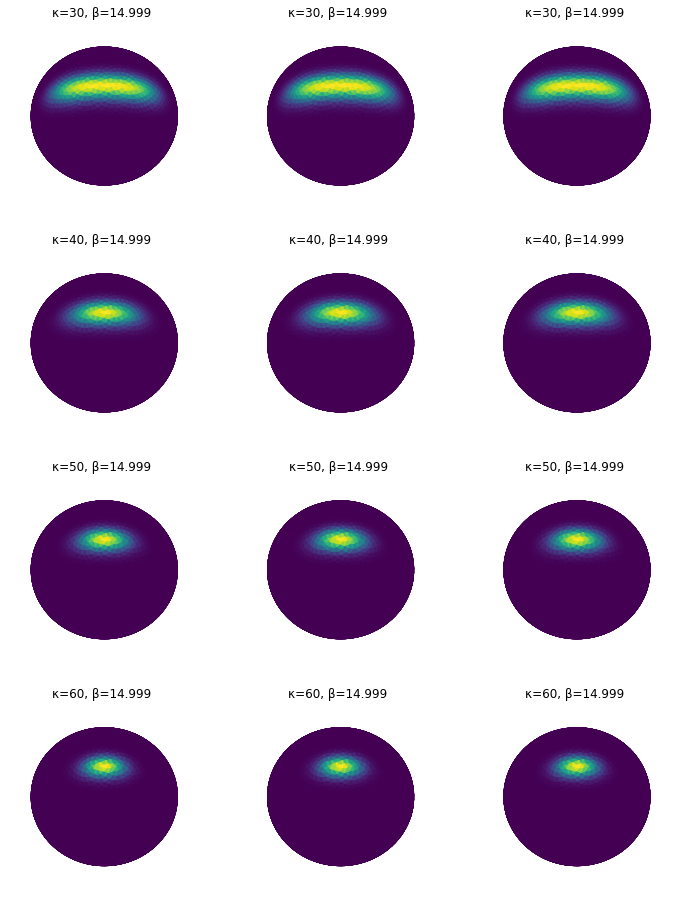

In [27]:
n_points = 3000
d = angle_visualization.triangulation.Delaunay_Sphere(n_points)
center_all = d.face_centroids


# Range of parameters
kappa_all = [30, 40, 50, 60]
beta_over_kappa_all = [30/2-0.001, 30/2-0.001, 30/2-0.001]
gamma = np.eye(3)[[2, 1, 0]]
params_grid = np.meshgrid(beta_over_kappa_all, kappa_all)
params_grid = [params_grid[0].flatten(), params_grid[1].flatten()]

# create the figure
figsize = (4 * len(beta_over_kappa_all), 4 * len(kappa_all))
fig = plt.figure(figsize=figsize)


for i, (beta_over_kappa, kappa) in enumerate(zip(*params_grid)):
    print(kappa)
    # Create distributions for given parameters
    beta = beta_over_kappa 
    k = Kent(gamma, kappa, beta)
    k_density = k(center_all)


    # Generate a color map from the density value
    cmap = sns.mpl_palette("viridis", as_cmap=True)
    rescaled = (k_density - k_density.min()) /\
               (k_density.max() - k_density.min())
    colors = cmap(rescaled)

    # Plot the density
    ax = fig.add_subplot(len(kappa_all), len(beta_over_kappa_all),
                         i + 1, projection='3d')
    ax.view_init(60, 0)
    angle_visualization.plot_faces(d.faces, ax=ax, linewidths=1,
                                   face_colors=colors, edge_colors=colors)
    angle_visualization.utils.set_3Dlim(*[[-.8, .8] for _ in range(3)],
                                        ax=ax)
    ax.set_title(f"κ={kappa}, β={beta}")

    # Final tweaking and save the figure
    ax.axis('off')


In [ ]:
"""
Example plots for spherical distributions
Author: Romain Fayat, April 2021
"""
import numpy as np
from SphereProba.distributions import VonMisesFisher, Kent
import matplotlib.pyplot as plt
from pathlib import Path
import angle_visualization.triangulation
import seaborn as sns


def plot_vMF(*args, **kwargs):
    "Plot example von Mises Fisher distributions"

    # Create  a triangulated sphere
    n_points = 3000
    d = angle_visualization.triangulation.Delaunay_Sphere(n_points)
    center_all = d.face_centroids

    # Range of parameters
    kappa_all = [0.001, 0.01, 1., 10, 100]
    mu_all = [np.array([0, 0, 1])] * len(kappa_all)

    fig = plt.figure(figsize=(4 * len(mu_all), 4))
    for i, (mu, kappa) in enumerate(zip(mu_all, kappa_all)):
        # Create distributions for given parameters
        vmf = VonMisesFisher(mu, kappa)
        vmf_density = vmf(center_all)

        # Generate a color map from the density value
        cmap = sns.mpl_palette("viridis", as_cmap=True)
        rescaled = (vmf_density - vmf_density.min()) /\
                   (vmf_density.max() - vmf_density.min())
        colors = cmap(rescaled)

        # Plot the density
        ax = fig.add_subplot(1, len(mu_all), i + 1, projection='3d')

        angle_visualization.plot_faces(d.faces, ax=ax, linewidths=1,
                                       face_colors=colors, edge_colors=colors)
        ax.scatter(*mu, c="w", s=30)
        angle_visualization.utils.set_3Dlim(*[[-.8, .8] for _ in range(3)],
                                            ax=ax)
        # Final tweaking and save the figure
        ax.axis('off')
        ax.set_title(f"κ={kappa}")
    fig.tight_layout()
    fig.savefig(*args, **kwargs)
    plt.close(fig)


def plot_kent(*args, **kwargs):
    "Plot example Kent distributions"
    # Create  a triangulated sphere
    n_points = 3000
    d = angle_visualization.triangulation.Delaunay_Sphere(n_points)
    center_all = d.face_centroids


    # Range of parameters
    kappa_all = [.01, 1, 10, 100]
    beta_over_kappa_all = [0, .25, .49]
    gamma = np.eye(3)[[2, 1, 0]]
    params_grid = np.meshgrid(beta_over_kappa_all, kappa_all)
    params_grid = [params_grid[0].flatten(), params_grid[1].flatten()]

    # create the figure
    figsize = (4 * len(beta_over_kappa_all), 4 * len(kappa_all))
    fig = plt.figure(figsize=figsize)


    for i, (beta_over_kappa, kappa) in enumerate(zip(*params_grid)):

        # Create distributions for given parameters
        beta = beta_over_kappa * kappa
        k = Kent(gamma, kappa, beta)
        k_density = k(center_all)


        # Generate a color map from the density value
        cmap = sns.mpl_palette("viridis", as_cmap=True)
        rescaled = (k_density - k_density.min()) /\
                   (k_density.max() - k_density.min())
        colors = cmap(rescaled)

        # Plot the density
        ax = fig.add_subplot(len(kappa_all), len(beta_over_kappa_all),
                             i + 1, projection='3d')
        ax.view_init(60, 0)
        angle_visualization.plot_faces(d.faces, ax=ax, linewidths=1,
                                       face_colors=colors, edge_colors=colors)
        angle_visualization.utils.set_3Dlim(*[[-.8, .8] for _ in range(3)],
                                            ax=ax)
        ax.set_title(f"κ={kappa}, β={beta}")

        # Final tweaking and save the figure
        ax.axis('off')

    fig.tight_layout()
    fig.savefig(*args, **kwargs)
    plt.close(fig)



if __name__ == "__main__":
    OUTPUT_FOLDER = Path(__file__).parent
    p = OUTPUT_FOLDER / "vmf.png"
    plot_vMF(p, transparent=True)
    p = OUTPUT_FOLDER / "kent.png"
    plot_kent(p, transparent=True)

NameError: name '__file__' is not defined

## Examples

### For $| \psi \rangle =   \frac{1}{\sqrt{2}} |0\rangle + \frac{1}{\sqrt{2}}|1\rangle$

#### Small number of atoms

In [589]:
# Ns = [10,12,14,16,18,20,22,24,26,28,30,32,34,38,40,60,80,100,200,300,400,600]
Ns = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,35,40,45,50,60,65,70,75,80,85,90,95,100,120,140,160,180,200,400,600,800]
# Ns = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]

ttt = np.zeros([1,np.size(Ns)])
Chci = np.zeros([1,np.size(Ns)])
Chce = np.zeros([1,np.size(Ns)])
G_Chci = np.zeros([1,np.size(Ns)])
G_Chce = np.zeros([1,np.size(Ns)])
over_all = np.zeros([1,np.size(Ns)])

number_of_testing_points = 30

for itter in tqdm(range(np.size(Ns))):
    
    N_a = Ns[itter] #size of the system
    time_c = np.linspace(0,5.5/3 * (N_a)**(-3/2),50)
    
    J = build_J(N_a/2) #definition of J operators
    vacuum_state = q.basis(N_a + 1, 0) #vacuum state in collective spins, prepared in J_z axis

    testing_superposition_state = 1/np.sqrt(2) * q.basis(N_a + 1, 0) + 1/np.sqrt(2) * q.basis(N_a + 1, 1)

    number_of_testing_points = 50
    
    number_of_testing_points = 1000
    alphas = np.linspace(0.01,5,number_of_testing_points)
    # epsilon = -1 #-10**-(9)
    var_maximal = np.zeros([number_of_testing_points,1])

    testing_superposition_state_r = rotation_calibration(testing_superposition_state,J)

    var_testing_state = np.zeros([1,50])
    var_border_state = np.zeros([1,50])

    for tt_c in range(50):
        var_minimal = np.zeros([number_of_testing_points,1])
    
        for i in range(number_of_testing_points):    
            #H = alphas[i] * J['z']**2 + (1 - alphas[i]) * J['y']**2 + epsilon * J['x']
            g = alphas[i]
    
            H = (g**2)/(1 + g**2) * J['z']**2 +  1/(1 + g**2) * J['y']**2 - g/(1 + g**2) * J['x'] 
            l, v = H.eigenstates()
        
            # minimal_state = rotation_calibration(v[0], J)
            # var_minimal[i] = Calc_variance_3(minimal_state, time_c[tt_c], J)    
            var_minimal[i] = Calc_variance_3(rotation_calibration(v[0],J), time_c[tt_c], J)
                                
        var_testing_state[0][tt_c] = Calc_variance_3(testing_superposition_state_r, time_c[tt_c], J)
        var_border_state[0][tt_c] = min(min(var_minimal))
    ttt[0][itter] = time_c[np.where(np.min(var_testing_state/var_border_state) == (var_testing_state/var_border_state))[1][0]]
    Chci[0][itter] = np.min(var_testing_state[0]) 
    Chce[0][itter] = var_border_state[0][np.where (np.min(var_testing_state[0]) == var_testing_state[0] )[0]]
    G_Chci[0][itter] = var_testing_state[0][np.where(np.min(var_testing_state/var_border_state)== var_testing_state/var_border_state)[1][0]]
    G_Chce[0][itter] = var_border_state[0][np.where(np.min(var_testing_state/var_border_state)== var_testing_state/var_border_state)[1][0]]
    over_all[0][itter] = np.min(var_testing_state/var_border_state)

  0%|                                                                                                    | 0/51 [00:00<?, ?it/s]/tmp/ipykernel_9764/606621330.py:48: ComplexWarning: Casting complex values to real discards the imaginary part
  var_minimal[i] = Calc_variance_3(rotation_calibration(v[0],J), time_c[tt_c], J)
/tmp/ipykernel_9764/606621330.py:50: ComplexWarning: Casting complex values to real discards the imaginary part
  var_testing_state[0][tt_c] = Calc_variance_3(testing_superposition_state_r, time_c[tt_c], J)
100%|████████████████████████████████████████████████████████████████████████████████████| 51/51 [190:48:51<00:00, 13469.24s/it]


In [590]:
# sio.loadmat('/home/simon/Desktop/Škola/Univerzita Palackého/Studium/3. Doktorské studium/Bosses/Peter Parker/Články/Witness of Fidelity/Results/Data_for_figures/',{"over_all":over_all})

Nss = Ns + [1000]
over_alll = over_all[0].tolist() + [0.7697470657800306]

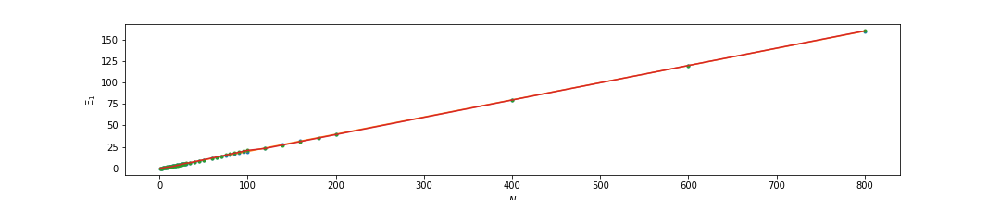

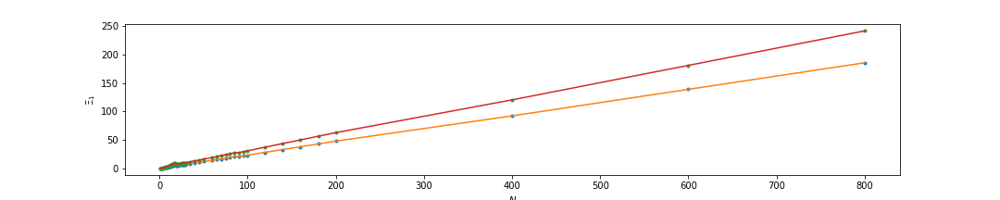

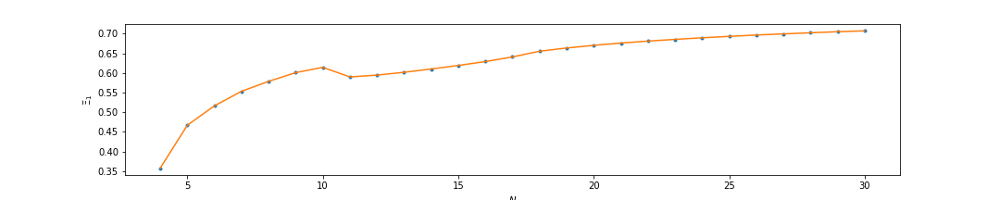

In [602]:
fig, ax = plt.subplots()

ax.plot(Ns,Chci[0],'.',Ns,Chci[0],Ns, Chce[0],'.',Ns, Chce[0])
ax.set_xlabel('$N$')
ax.set_ylabel('$\Xi _1$');
# plt.savefig("test_dimensions.svg")

fig, ax = plt.subplots()

ax.plot(Ns,G_Chci[0],'.',Ns,G_Chci[0],Ns, G_Chce[0],'.',Ns, G_Chce[0])
ax.set_xlabel('$N$')
ax.set_ylabel('$\Xi _1$');

# fig, ax = plt.subplots()

# plt.rcParams['figure.figsize'] = 15, 3
# ax.plot(Nss,over_alll,'.',Nss,over_alll)
# ax.set_xlabel('$N$')
# ax.set_ylabel('$\Xi _1$');
# plt.savefig("all_sizes.svg")

fig, ax = plt.subplots()

ax.plot(Ns[0:30],over_all[0][0:30],'.',Ns[0:30],over_all[0][0:30])
ax.set_xlabel('$N$')
ax.set_ylabel('$\Xi _1$');
# plt.savefig("small_numbers.svg")

# fig, ax = plt.subplots()

# ax.plot(Ns,Chci[0],'.',Ns,Chci[0],Ns, Chce[0],'.',Ns, Chce[0])
# ax.set_xlabel('$N$')
# ax.set_ylabel('$\Xi _1$');
# plt.savefig("test_dimensions.svg")

# fig, ax = plt.subplots()

# ax.plot(Ns,G_Chci[0],'.',Ns,G_Chci[0],Ns, G_Chce[0],'.',Ns, G_Chce[0])
# ax.set_xlabel('$N$')
# ax.set_ylabel('$\Xi _1$');
# # plt.savefig("test_dimensions.svg")

In [596]:
%matplotlib inline

In [614]:
Nss[3:]

[4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 35,
 40,
 45,
 50,
 60,
 65,
 70,
 75,
 80,
 85,
 90,
 95,
 100,
 120,
 140,
 160,
 180,
 200,
 400,
 600,
 800,
 1000]

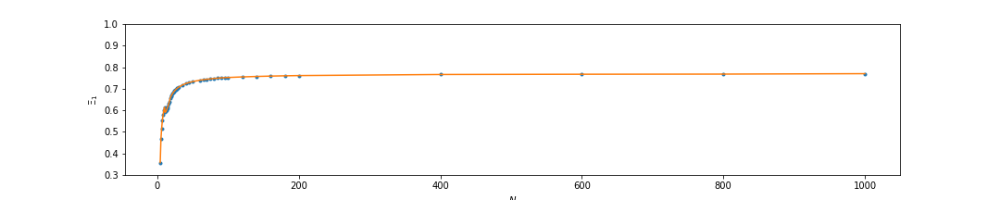

In [615]:
fig, ax = plt.subplots()
ax.plot(Nss[3:],over_alll[3:],'.',Nss[3:],over_alll[3:])
ax.set_xlabel('$N$')
ax.set_ylabel('$\Xi _1$');
ax.set(ylim=(0.3, 1))
plt.savefig("all_sizes.svg")

In [593]:
sio.savemat('/home/simon/Desktop/Škola/Univerzita Palackého/Studium/3. Doktorské studium/Bosses/Peter Parker/Články/Witness of Fidelity/Results/Data_for_figures_2/ttt.mat',{"ttt":ttt})
sio.savemat('/home/simon/Desktop/Škola/Univerzita Palackého/Studium/3. Doktorské studium/Bosses/Peter Parker/Články/Witness of Fidelity/Results/Data_for_figures_2/Chci.mat',{"Chci":Chci})
sio.savemat('/home/simon/Desktop/Škola/Univerzita Palackého/Studium/3. Doktorské studium/Bosses/Peter Parker/Články/Witness of Fidelity/Results/Data_for_figures_2/Chce.mat',{"Chce":Chce})
sio.savemat('/home/simon/Desktop/Škola/Univerzita Palackého/Studium/3. Doktorské studium/Bosses/Peter Parker/Články/Witness of Fidelity/Results/Data_for_figures_2/G_Chci.mat',{"G_Chci":G_Chci})
sio.savemat('/home/simon/Desktop/Škola/Univerzita Palackého/Studium/3. Doktorské studium/Bosses/Peter Parker/Články/Witness of Fidelity/Results/Data_for_figures_2/G_Chce.mat',{"G_Chce":G_Chce})
sio.savemat('/home/simon/Desktop/Škola/Univerzita Palackého/Studium/3. Doktorské studium/Bosses/Peter Parker/Články/Witness of Fidelity/Results/Data_for_figures_2/over_all.mat',{"over_all":over_all})

In [594]:
even_atoms = np.zeros([np.size(Ns[0:15])])
odd_atoms = np.zeros([np.size(Ns[0:15])])
even_N = np.zeros([np.size(Ns[0:15])])
odd_N = np.zeros([np.size(Ns[0:15])])

for jej in range(np.size(Ns[0:15])):
    
    even = 2*jej
    odd = 2*jej+1
    even_atoms[jej] = over_all[0][even]
    odd_atoms[jej] = over_all[0][odd]
    even_N[jej] = Ns[even]
    odd_N[jej] = Ns[odd]

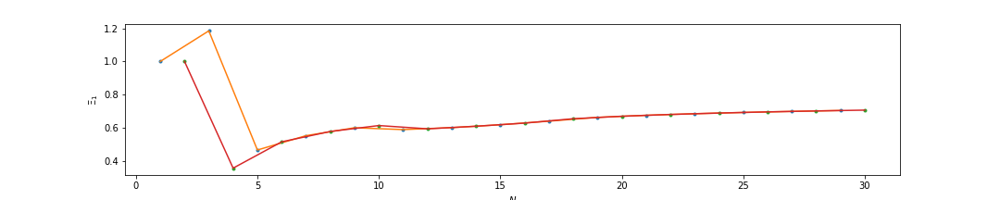

In [595]:
fig, ax = plt.subplots()

ax.plot(even_N,even_atoms,'.',even_N,even_atoms, odd_N,odd_atoms,'.', odd_N,odd_atoms)
ax.set_xlabel('$N$')
ax.set_ylabel('$\Xi _1$');


plt.rcParams['figure.figsize'] = 15, 3

plt.savefig("small_numbers.svg")

### Full interval 

In [3]:
# Ns = [10,12,14,16,18,20,22,24,26,28,30,32,34,38,40,60,80,100,200,300,400,600]
Ns = [11,12,13,14,15,16,17,18,19,20]#,24,30,34,40,60,80,100,120,140,160,180,200,400,600]

Chci = np.zeros([1,np.size(Ns)])
Chce = np.zeros([1,np.size(Ns)])
G_Chci = np.zeros([1,np.size(Ns)])
G_Chce = np.zeros([1,np.size(Ns)])
over_all = np.zeros([1,np.size(Ns)])

number_of_testing_points = 50

for itter in tqdm(range(np.size(Ns))):
    
    N_a = Ns[itter] #size of the system
    time_c = np.linspace(0,5.5/3 * (N_a)**(-3/2),50)
    
    J = build_J(N_a/2) #definition of J operators
    vacuum_state = q.basis(N_a + 1, 0) #vacuum state in collective spins, prepared in J_z axis

    testing_superposition_state = 1/np.sqrt(2) * q.basis(N_a + 1, 0) + 1/np.sqrt(2) * q.basis(N_a + 1, 1)

    number_of_testing_points = 50
    
    alphas = np.linspace(0.1,0.9,number_of_testing_points)
    epsilon = -10**-(9)
    var_maximal = np.zeros([number_of_testing_points,1])

    testing_superposition_state_r = rotation_calibration(testing_superposition_state,J)

    var_testing_state = np.zeros([1,50])
    var_border_state = np.zeros([1,50])

    for tt_c in range(50):
        var_minimal = np.zeros([number_of_testing_points,1])
    
        for i in range(number_of_testing_points):    
            H = alphas[i] * J['z']**2 + (1 - alphas[i]) * J['y']**2 + epsilon * J['x']
        
            l, v = H.eigenstates()
        
            minimal_state = rotation_calibration(v[0], J)
            var_minimal[i] = Calc_variance_3(minimal_state, time_c[tt_c], J)
            # var_minimal[i] = Calc_variance_3(v[0], time_c[tt_c], J)
                                
        var_testing_state[0][tt_c] = Calc_variance_3(testing_superposition_state_r, time_c[tt_c], J)
        var_border_state[0][tt_c] = min(min(var_minimal))

    Chci[0][itter] = np.min(var_testing_state[0]) 
    Chce[0][itter] = var_border_state[0][np.where (np.min(var_testing_state[0]) == var_testing_state[0] )[0]]
    G_Chci[0][itter] = var_testing_state[0][np.where(np.min(var_testing_state/var_border_state)== var_testing_state/var_border_state)[1][0]]
    G_Chce[0][itter] = var_border_state[0][np.where(np.min(var_testing_state/var_border_state)== var_testing_state/var_border_state)[1][0]]
    over_all[0][itter] = np.min(var_testing_state/var_border_state)

  0%|                                                  | 0/10 [00:00<?, ?it/s]/tmp/ipykernel_551208/2173423656.py:42: ComplexWarning: Casting complex values to real discards the imaginary part
  var_minimal[i] = Calc_variance_3(minimal_state, time_c[tt_c], J)
/tmp/ipykernel_551208/2173423656.py:45: ComplexWarning: Casting complex values to real discards the imaginary part
  var_testing_state[0][tt_c] = Calc_variance_3(testing_superposition_state_r, time_c[tt_c], J)
100%|█████████████████████████████████████████| 10/10 [07:45<00:00, 46.54s/it]


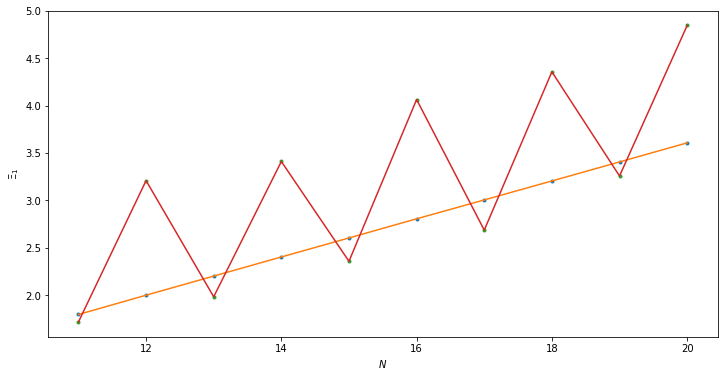

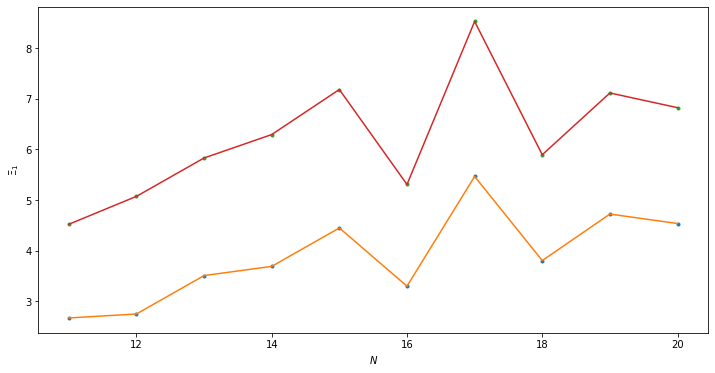

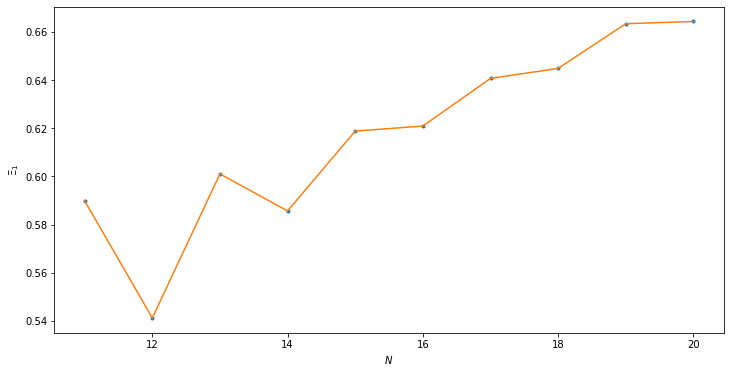

In [422]:
fig, ax = plt.subplots()

ax.plot(Ns,Chci[0],'.',Ns,Chci[0],Ns, Chce[0],'.',Ns, Chce[0])
ax.set_xlabel('$N$')
ax.set_ylabel('$\Xi _1$');
# plt.savefig("test_dimensions.svg")

fig, ax = plt.subplots()

ax.plot(Ns,G_Chci[0],'.',Ns,G_Chci[0],Ns, G_Chce[0],'.',Ns, G_Chce[0])
ax.set_xlabel('$N$')
ax.set_ylabel('$\Xi _1$');

fig, ax = plt.subplots()

ax.plot(Ns,over_all[0],'.',Ns,over_all[0])
ax.set_xlabel('$N$')
ax.set_ylabel('$\Xi _1$');


# plt.savefig("test_dimensions.svg")

In [150]:
np.where(np.min(var_testing_state/var_border_state)== var_testing_state/var_border_state)[1][0]

21

In [156]:
var_testing_state[0][21]

4.533924665941604

In [158]:
var_border_state[0][21]

6.825310403860744

In [161]:
np.where (np.min(var_testing_state[0]) == var_testing_state[0])[0][0]

10

In [162]:
np.min(var_testing_state[0])

3.607195334164402

In [163]:
var_border_state[0][10]

4.845540004127125

In [164]:
var_testing_state[0][np.where(np.min(var_testing_state/var_border_state)== var_testing_state/var_border_state)[1][0]]

4.533924665941604

In [165]:
var_border_state[0][np.where(np.min(var_testing_state/var_border_state)== var_testing_state/var_border_state)[1][0]]

6.825310403860744

#### $N = 80$

In [5]:
N_a = 80 #size of the system
J = build_J(N_a/2) #definition of J operators
vacuum_state = q.basis(N_a + 1, 0) #vacuum state in collective spins, prepared in J_z axis

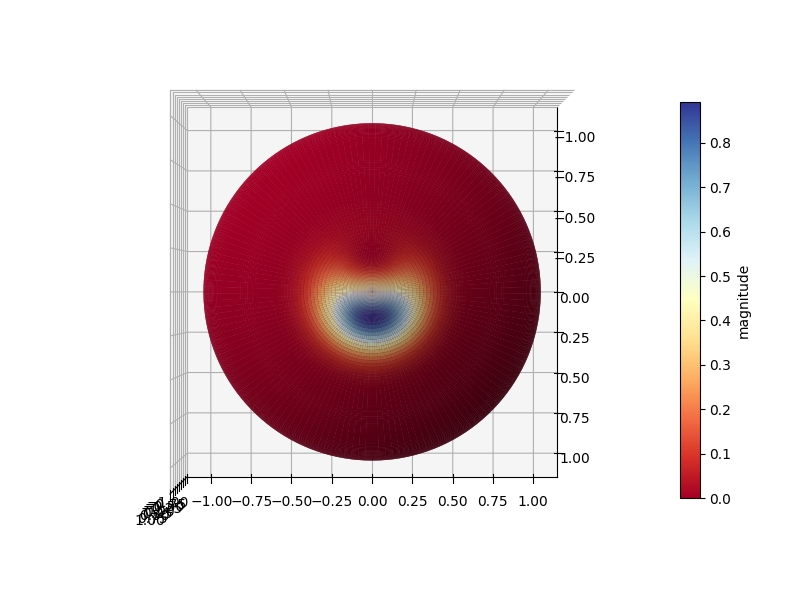

In [6]:
testing_superposition_state = 1/np.sqrt(2) * q.basis(N_a + 1, 0) + 1/np.sqrt(2) * q.basis(N_a + 1, 1)

QQ, THETA, PHI = q.spin_q_function(testing_superposition_state*testing_superposition_state.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(90,0)

/tmp/ipykernel_10208/1770634827.py:28: ComplexWarning: Casting complex values to real discards the imaginary part
  var_minimal[i] = Calc_variance_3(minimal_state, time_c[tt_c], J)
/tmp/ipykernel_10208/1770634827.py:36: ComplexWarning: Casting complex values to real discards the imaginary part
  var_testing_state[0][tt_c] = Calc_variance_3(testing_superposition_state_r, time_c[tt_c], J)


Code ran in 404.1625 seconds


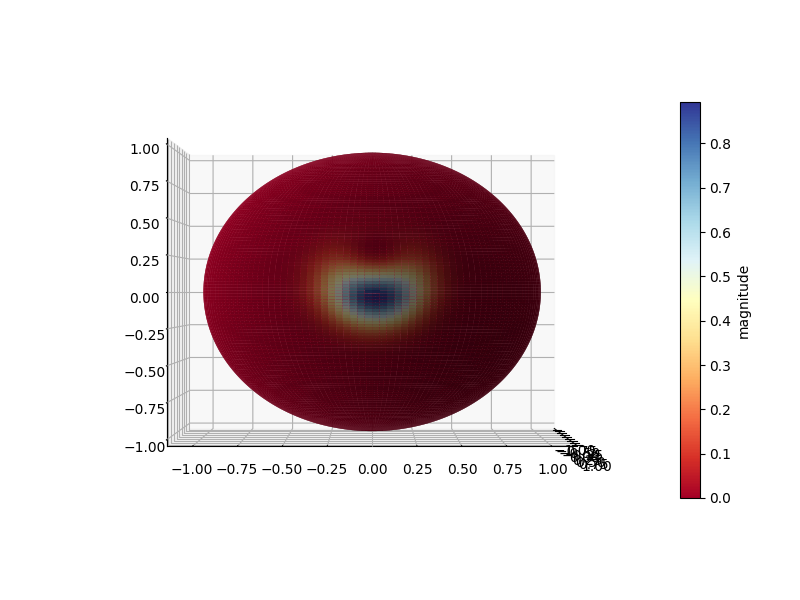

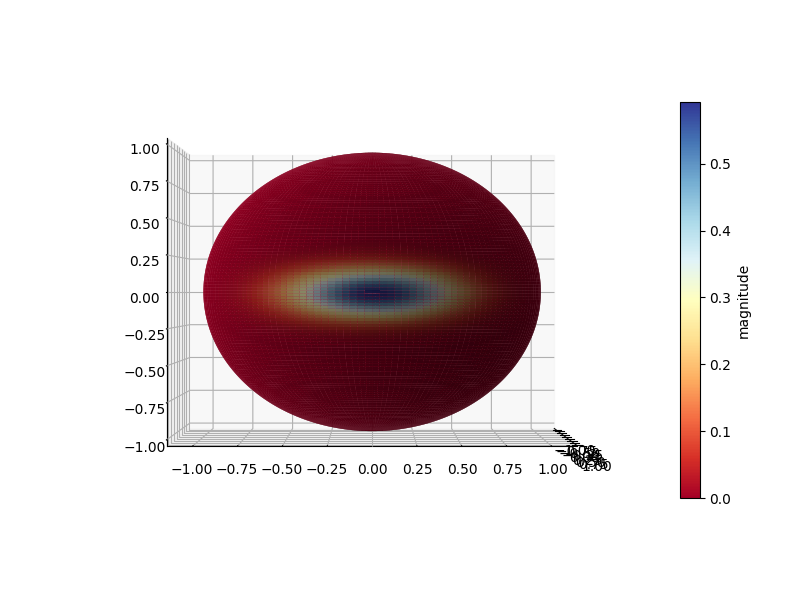

In [7]:
start_time = time.time()

testing_superposition_state_r = rotation_calibration(testing_superposition_state,J)
QQ, THETA, PHI = q.spin_q_function(testing_superposition_state_r*testing_superposition_state_r.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(0,0)


time_c = np.linspace(0,0.003,50)
var_testing_state = np.zeros([1,50])
var_border_state = np.zeros([1,50])

number_of_testing_points = 100
alphas = np.linspace(0,1,number_of_testing_points)
epsilon = -1#-10**-(9)
var_maximal = np.zeros([number_of_testing_points,1])

for tt_c in range(50):
    
    
    var_minimal = np.zeros([number_of_testing_points,1])
    for i in range(number_of_testing_points):    
        H = alphas[i] * J['z']**2 + (1 - alphas[i]) * J['y']**2 + epsilon * J['x']

        l, v = H.eigenstates()

        minimal_state = rotation_calibration(v[0], J)
        var_minimal[i] = Calc_variance_3(minimal_state, time_c[tt_c], J)    
    
    if tt_c == 0:
        
        QQ, THETA, PHI = q.spin_q_function(v[0]*v[0].dag(), phi, tau )
        fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
        ax.view_init(0,0)
                            
    var_testing_state[0][tt_c] = Calc_variance_3(testing_superposition_state_r, time_c[tt_c], J)
    var_border_state[0][tt_c] = min(min(var_minimal))
    
end_time = time.time()
elapsed_time = end_time - start_time

print(f"Code ran in {elapsed_time:.4f} seconds")

In [7]:
%matplotlib inline

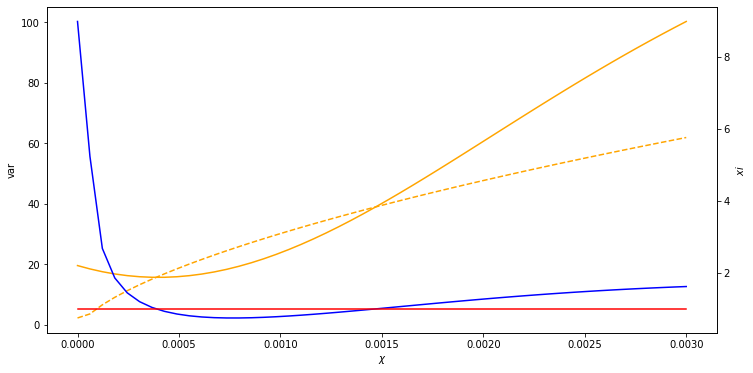

Miminal var of supperpossition =  15.626246267410608
Miminal var of borderstate =  2.172366684007538
0.7478554746027256


In [242]:
# plt.figure(figsize=(8, 5))
# plt.plot(time_c, var_testing_state[0],time_c, var_border_state[0])

fig, ax1 = plt.subplots() 
  
ax1.set_xlabel('$\chi$') 
ax1.set_ylabel('var') 
ax1.plot(time_c, var_testing_state[0], time_c, var_border_state[0],'--', color = 'orange')



# Adding Twin Axes

ax2 = ax1.twinx() 
  
ax2.set_ylabel('$xi$') 
ax2.plot(time_c, var_testing_state[0]/var_border_state[0], color = 'blue') 
ax2.plot(time_c,np.ones([50,1]), color = 'red')
plt.show()
plt.rcParams['figure.figsize'] = 12, 6
fig.savefig("min_chi.svg")


print("Miminal var of supperpossition = ", min(var_testing_state[0]))
print("Miminal var of borderstate = ", min(var_border_state[0]))
print(np.min(var_testing_state[0]/var_border_state[0]))

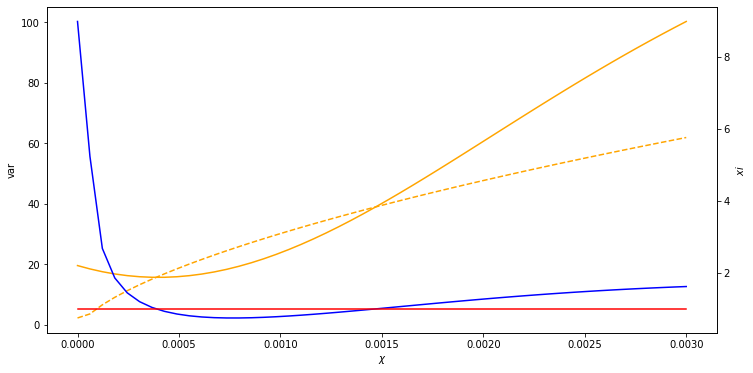

In [237]:
fig, ax1 = plt.subplots() 
  
ax1.set_xlabel('$\chi$') 
ax1.set_ylabel('var') 
ax1.plot(time_c, var_testing_state[0], time_c, var_border_state[0],'--', color = 'orange')

# ax1.ylim(top=40)


# Adding Twin Axes

ax2 = ax1.twinx() 
  
ax2.set_ylabel('$xi$') 
ax2.plot(time_c, var_testing_state[0]/var_border_state[0], color = 'blue') 
ax2.plot(time_c,np.ones([50,1]), color = 'red')

plt.show()
plt.rcParams['figure.figsize'] = 12, 6



In [238]:
cislo = np.where(var_testing_state[0] == min(min(var_testing_state)))
print(var_border_state[0][cislo])

[16.77090564]


In [28]:
np.where(var_testing_state[0]/var_border_state[0] == min(var_testing_state[0]/var_border_state[0]))[0][0]

/tmp/ipykernel_257301/952143318.py:1: RuntimeWarning: divide by zero encountered in true_divide
  np.where(var_testing_state[0]/var_border_state[0] == min(var_testing_state[0]/var_border_state[0]))[0][0]


13

In [29]:
time_c[13]

0.0007959183673469387

In [241]:
-10*np.log10(np.min(var_testing_state[0]/var_border_state[0]))

1.2618232278668726

In [76]:
13

0.9317099099960473

In [395]:
 for i in range(number_of_testing_points):    
        H = alphas[i] * J['z']**2 + (1 - alphas[i]) * J['y']**2 + epsilon * J['x']

        l, v = H.eigenstates()

        minimal_state = rotation_calibration(v[0], J)
        var_minimal[i] = Calc_variance_3(minimal_state, time_c[13], J)  

/tmp/ipykernel_2353920/3770995104.py:7: ComplexWarning: Casting complex values to real discards the imaginary part
  var_minimal[i] = Calc_variance_3(minimal_state, time_c[13], J)


In [401]:
np.where(np.min(var_minimal) == var_minimal)[0][0]

59

In [410]:
H = alphas[59] * J['z']**2 + (1 - alphas[59]) * J['y']**2 + epsilon * J['x']
l, v = H.eigenstates()

v[0] = (-1j * pi/2 * J['x']).expm() * v[0]

Q_0, THETA, PHI = q.spin_wigner(v[0]*v[0].dag(), phi, tau )

In [412]:
sio.savemat("eigenstate_squeez.mat",{"Q_0":Q_0})
sio.savemat("eigenstate_squeez_theta.mat",{"THETA":THETA})
sio.savemat("eigenstate_squeez_phi.mat",{"PHI":PHI})

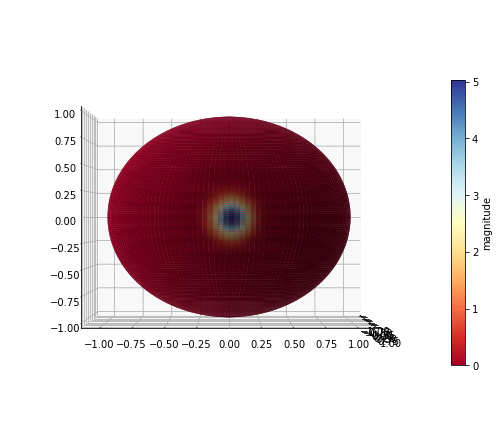

In [411]:
fig, ax = q.plot_spin_distribution_3d(Q_0,THETA, PHI)
ax.view_init(0,0)

In [18]:
chci_to = np.zeros([60,1])
uhel = np.linspace(-pi,pi,60)
output_parameter = np.zeros([60,1])
tt_c = time_c[np.where(var_testing_state[0] == min(min(var_testing_state)))[0][0]]
O13 = (-1j * tt_c * J['z']**3).expm() * J['y'] * (1j * tt_c * J['z']**3).expm()  

for posuneme in range(60):
    r = (1j * J['z'] * uhel[posuneme] ).expm() * (1j * J['x'] * pi/2 ).expm()  * testing_superposition_state_r
    chci_to[posuneme] = ((r.dag() * O13**2 * r) - (r.dag() * O13 * r)**2)[0][0][0] 
    output_parameter[posuneme] = chci_to[posuneme]/var_border_state[0][7]

/tmp/ipykernel_156783/767986985.py:9: ComplexWarning: Casting complex values to real discards the imaginary part
  chci_to[posuneme] = ((r.dag() * O13**2 * r) - (r.dag() * O13 * r)**2)[0][0][0]


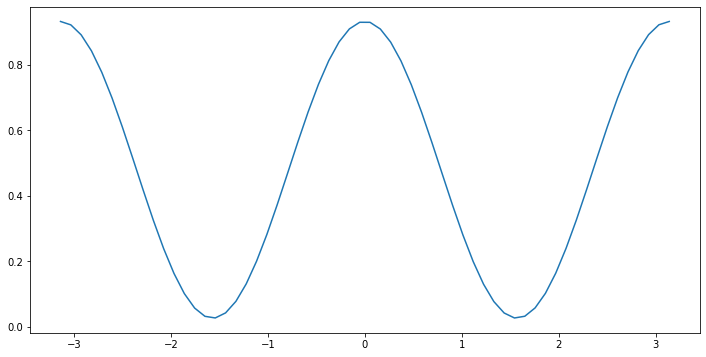

In [19]:
plt.plot(uhel,output_parameter)

In [28]:
min(min(output_parameter))

0.026751247144230505

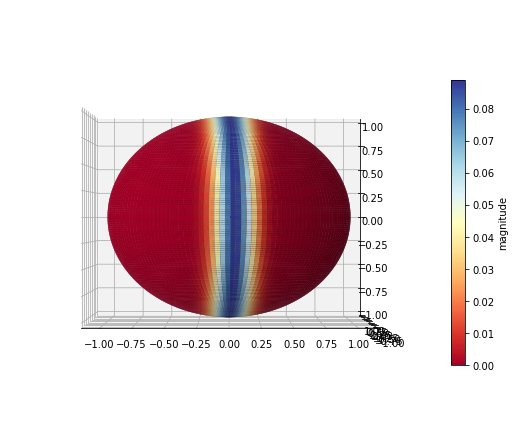

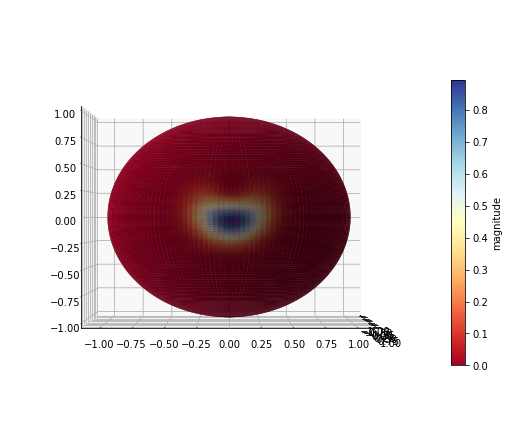

In [17]:
s_t_a_t_e = (1j * J['z'] * uhel[44] ).expm() * (1j * J['x'] * pi/2 ).expm()  * v[0]#testing_superposition_state_r

QQ, THETA, PHI = q.spin_q_function(s_t_a_t_e * s_t_a_t_e.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(0,-90)


QQ, THETA, PHI = q.spin_q_function(testing_superposition_state_r * testing_superposition_state_r.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(0,0)

In [22]:
blbec = np.zeros([10,20])

blbec[1][15] = 1

In [53]:
var13 = np.zeros([number_of_testing_points,60])
rotace = np.linspace(-pi/2,pi/2,60)


for i in range(number_of_testing_points):    
        H = alphas[i] * J['z']**2 + (1 - alphas[i]) * J['y']**2 + epsilon * J['x']

        l, v = H.eigenstates()

        minimal_state = rotation_calibration(v[0], J)
        aa = minimal_state
        for bb in range(60):
            
            O13 = (1j * J['y'] * rotace[bb] ).expm() * (1j * t_c * J['z']**3).expm() * J['y'] * (-1j * t_c * J['z']**3).expm() * (-1j * J['y'] * rotace[bb] ).expm()  
            var13[i][bb] = ((aa.dag() * O13**2 * aa) - (aa.dag() * O13 * aa)**2)[0][0][0]


/tmp/ipykernel_156783/3796805274.py:15: ComplexWarning: Casting complex values to real discards the imaginary part
  var13[i][bb] = ((aa.dag() * O13**2 * aa) - (aa.dag() * O13 * aa)**2)[0][0][0]


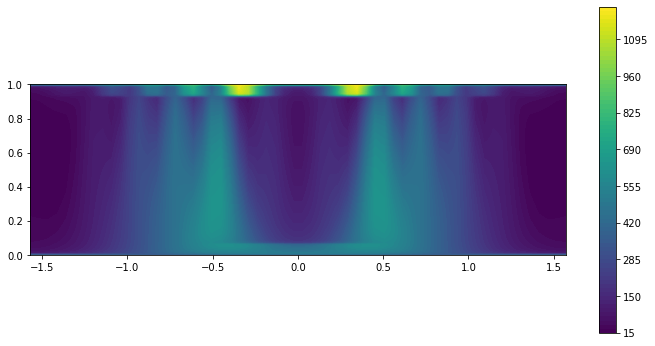

In [54]:
# xx, yy = np.meshgrid(alphas, rotace)
h = plt.contourf(rotace, alphas,  var13,100)
plt.axis('scaled')
plt.colorbar()
plt.show()


In [57]:
for k in range(100):

    aaaaaa[k] = min(var13[k])


min(min(output_parameter))/min(aaaaaa)

array([0.00177113])

In [56]:
print(aa.dag() * J['x'] * aa)
print(aa.dag() * J['y'] * aa)
print(aa.dag() * J['z'] * aa)

Quantum object: dims = [[1], [1]], shape = (1, 1), type = bra
Qobj data =
[[1.64e-06]]
Quantum object: dims = [[1], [1]], shape = (1, 1), type = bra
Qobj data =
[[0.]]
Quantum object: dims = [[1], [1]], shape = (1, 1), type = bra
Qobj data =
[[0.]]


In [164]:
print(var13)

(93.99763477608637+0j)


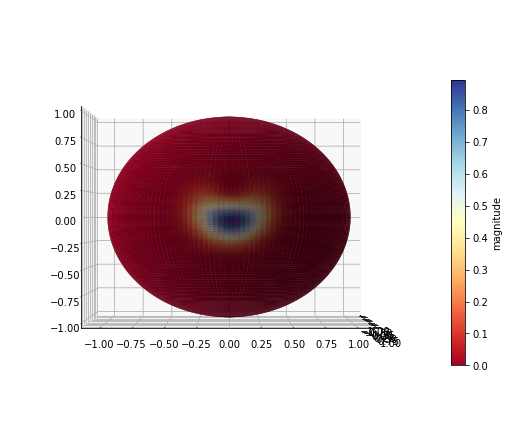

In [156]:
QQ, THETA, PHI = q.spin_q_function(aa * aa.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(0,0)

In [37]:
chci_to[0]

array([15.62624627])

In [34]:
np.where(output_parameter == (min(output_parameter)[0]))

(array([44]), array([0]))

#### $N = 200$

In [8]:
N_a = 200 #size of the system
J = build_J(N_a/2) #definition of J operators
vacuum_state = q.basis(N_a + 1, 0) #vacuum state in collective spins, prepared in J_z axis

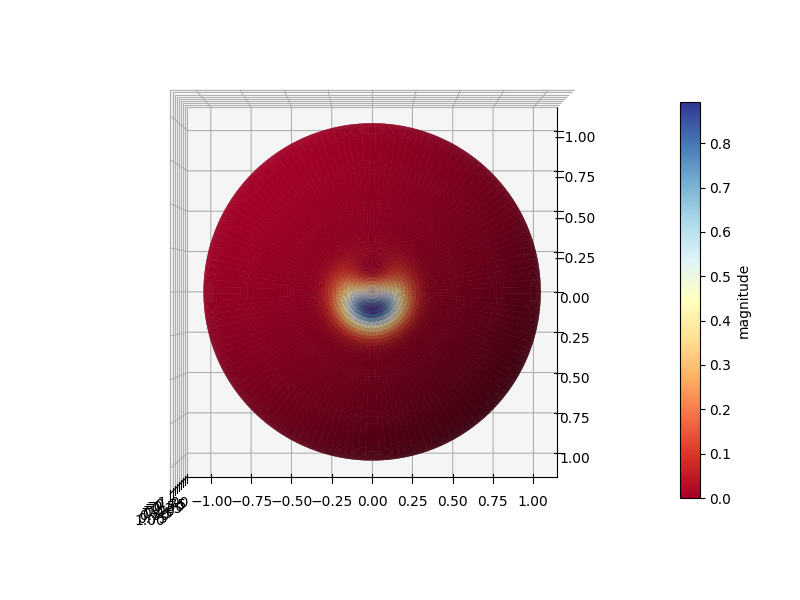

In [9]:
testing_superposition_state = 1/np.sqrt(2) * q.basis(N_a + 1, 0) + 1/np.sqrt(2) * q.basis(N_a + 1, 1)

QQ, THETA, PHI = q.spin_q_function(testing_superposition_state*testing_superposition_state.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(90,0)

/tmp/ipykernel_10208/967836237.py:28: ComplexWarning: Casting complex values to real discards the imaginary part
  var_minimal[i] = Calc_variance_3(minimal_state, time_c[tt_c], J)
/tmp/ipykernel_10208/967836237.py:36: ComplexWarning: Casting complex values to real discards the imaginary part
  var_testing_state[0][tt_c] = Calc_variance_3(testing_superposition_state_r, time_c[tt_c], J)


Code ran in 2634.4747 seconds


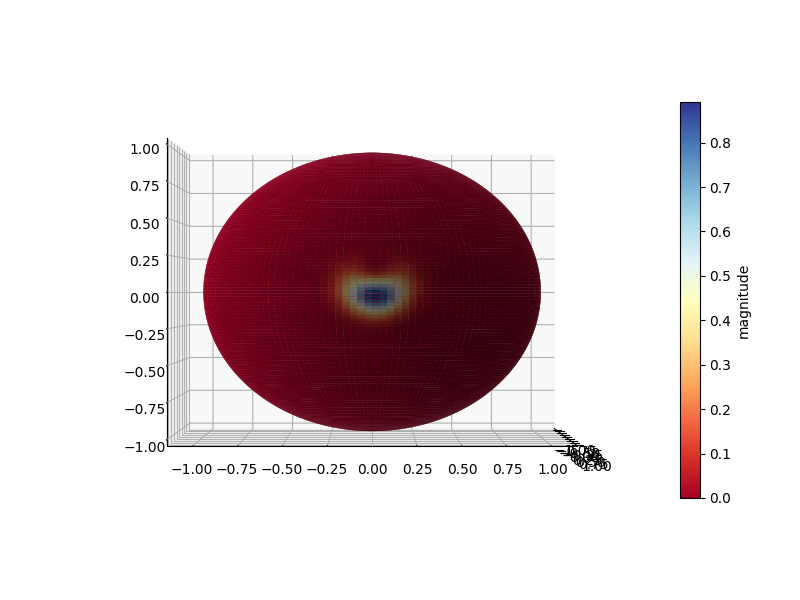

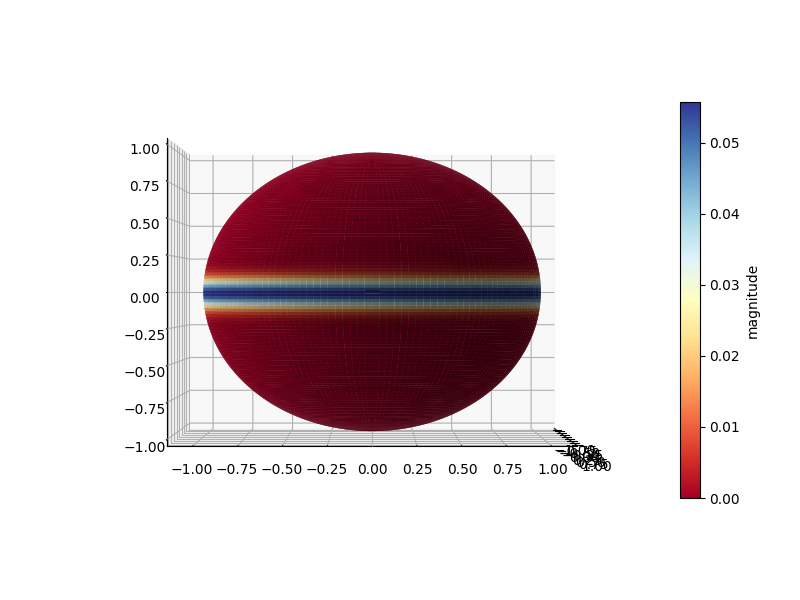

In [11]:
start_time = time.time()

testing_superposition_state_r = rotation_calibration(testing_superposition_state,J)
QQ, THETA, PHI = q.spin_q_function(testing_superposition_state_r*testing_superposition_state_r.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(0,0)


time_c = np.linspace(0,0.0004,50)
var_testing_state = np.zeros([1,50])
var_border_state = np.zeros([1,50])

number_of_testing_points = 100
alphas = np.linspace(0,1,number_of_testing_points)
epsilon = -10**-(9)
var_maximal = np.zeros([number_of_testing_points,1])

for tt_c in range(50):
    
    
    var_minimal = np.zeros([number_of_testing_points,1])
    for i in range(number_of_testing_points):    
        H = alphas[i] * J['z']**2 + (1 - alphas[i]) * J['y']**2 + epsilon * J['x']

        l, v = H.eigenstates()

        minimal_state = rotation_calibration(v[0], J)
        var_minimal[i] = Calc_variance_3(minimal_state, time_c[tt_c], J)    
    
    if tt_c == 0:
        
        QQ, THETA, PHI = q.spin_q_function(v[0]*v[0].dag(), phi, tau )
        fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
        ax.view_init(0,0)
                            
    var_testing_state[0][tt_c] = Calc_variance_3(testing_superposition_state_r, time_c[tt_c], J)
    var_border_state[0][tt_c] = min(min(var_minimal))


end_time = time.time()
elapsed_time = end_time - start_time
print(f"Code ran in {elapsed_time:.4f} seconds")

/tmp/ipykernel_2353920/1532538769.py:15: RuntimeWarning: divide by zero encountered in true_divide
  ax2.plot(time_c, var_testing_state[0]/var_border_state[0], color = 'blue')


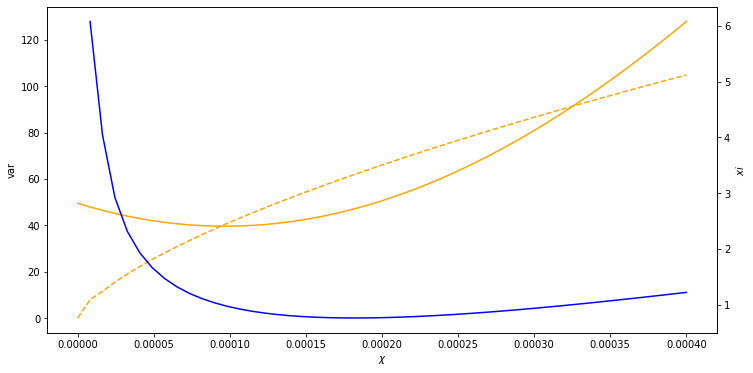

Miminal var of supperpossition =  39.604231153092755
Miminal var of borderstate =  0.0
0.7607921433984327


/tmp/ipykernel_2353920/1532538769.py:22: RuntimeWarning: divide by zero encountered in true_divide
  print(np.min(var_testing_state[0]/var_border_state[0]))


In [24]:
# plt.figure(figsize=(8, 5))
# plt.plot(time_c, var_testing_state[0],time_c, var_border_state[0])

fig, ax1 = plt.subplots() 
  
ax1.set_xlabel('$\chi$') 
ax1.set_ylabel('var') 
ax1.plot(time_c, var_testing_state[0], time_c, var_border_state[0],'--', color = 'orange') 
  
# Adding Twin Axes

ax2 = ax1.twinx() 
  
ax2.set_ylabel('$xi$') 
ax2.plot(time_c, var_testing_state[0]/var_border_state[0], color = 'blue') 
plt.show()
plt.rcParams['figure.figsize'] = 12, 6
fig.savefig("min_chi.svg")

print("Miminal var of supperpossition = ", min(var_testing_state[0]))
print("Miminal var of borderstate = ", min(var_border_state[0]))
print(np.min(var_testing_state[0]/var_border_state[0]))

#### $N = 400$

In [12]:
N_a = 400 #size of the system
J = build_J(N_a/2) #definition of J operators
vacuum_state = q.basis(N_a + 1, 0) #vacuum state in collective spins, prepared in J_z axis

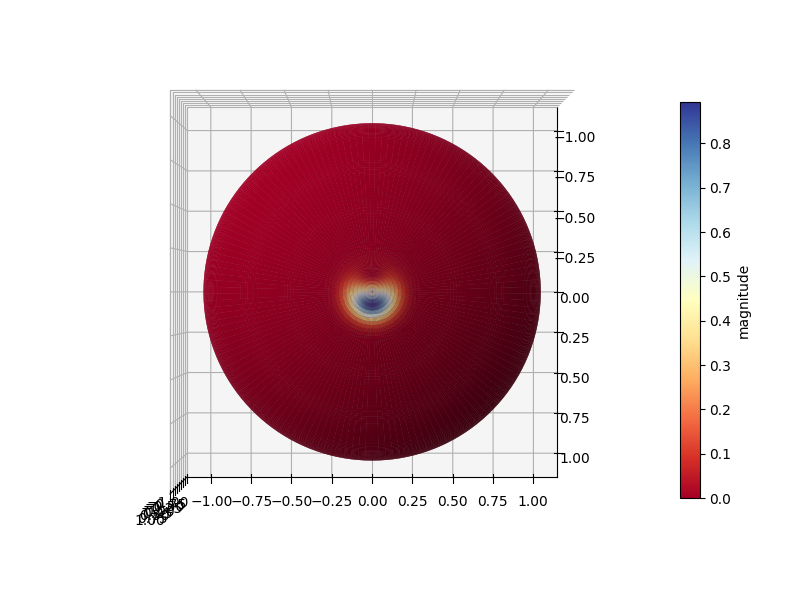

In [13]:
testing_superposition_state = 1/np.sqrt(2) * q.basis(N_a + 1, 0) + 1/np.sqrt(2) * q.basis(N_a + 1, 1)

QQ, THETA, PHI = q.spin_q_function(testing_superposition_state*testing_superposition_state.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(90,0)

/tmp/ipykernel_10208/849828957.py:27: ComplexWarning: Casting complex values to real discards the imaginary part
  var_minimal[i] = Calc_variance_3(minimal_state, time_c[tt_c], J)
/tmp/ipykernel_10208/849828957.py:35: ComplexWarning: Casting complex values to real discards the imaginary part
  var_testing_state[0][tt_c] = Calc_variance_3(testing_superposition_state_r, time_c[tt_c], J)


Code ran in 7444.6475 seconds


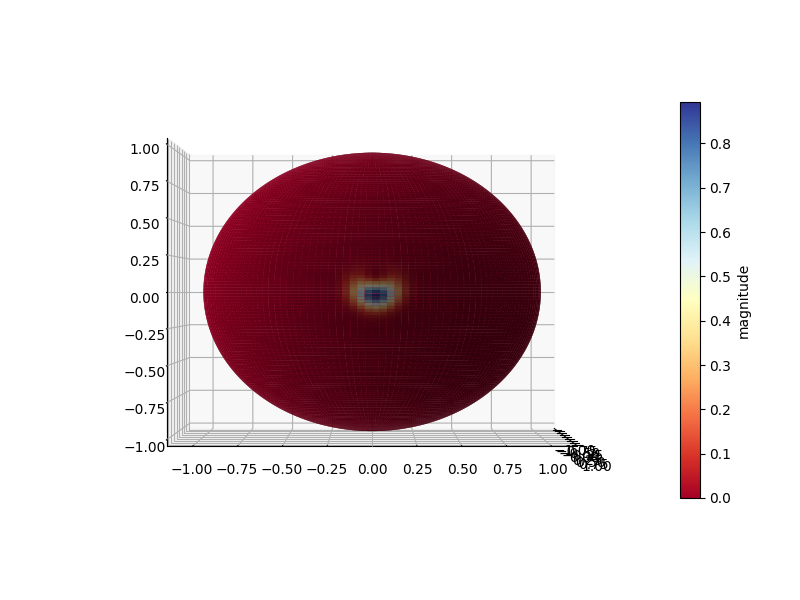

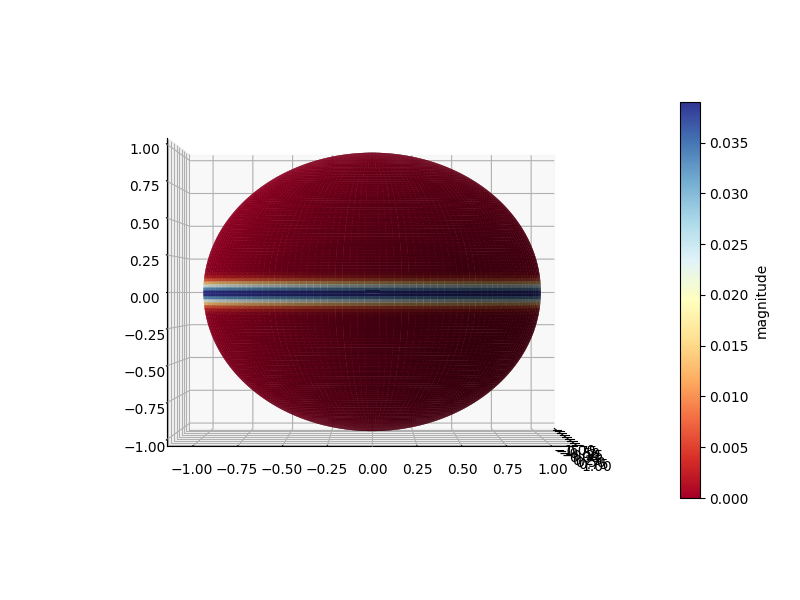

In [14]:
start_time = time.time()
testing_superposition_state_r = rotation_calibration(testing_superposition_state,J)
QQ, THETA, PHI = q.spin_q_function(testing_superposition_state_r*testing_superposition_state_r.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(0,0)


time_c = np.linspace(0,0.0004,50)
var_testing_state = np.zeros([1,50])
var_border_state = np.zeros([1,50])

number_of_testing_points = 100
alphas = np.linspace(0,1,number_of_testing_points)
epsilon = -10**-(9)
var_maximal = np.zeros([number_of_testing_points,1])

for tt_c in range(50):
    
    
    var_minimal = np.zeros([number_of_testing_points,1])
    for i in range(number_of_testing_points):    
        H = alphas[i] * J['z']**2 + (1 - alphas[i]) * J['y']**2 + epsilon * J['x']

        l, v = H.eigenstates()

        minimal_state = rotation_calibration(v[0], J)
        var_minimal[i] = Calc_variance_3(minimal_state, time_c[tt_c], J)    
    
    if tt_c == 0:
        
        QQ, THETA, PHI = q.spin_q_function(v[0]*v[0].dag(), phi, tau )
        fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
        ax.view_init(0,0)
                            
    var_testing_state[0][tt_c] = Calc_variance_3(testing_superposition_state_r, time_c[tt_c], J)
    var_border_state[0][tt_c] = min(min(var_minimal))
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Code ran in {elapsed_time:.4f} seconds")

/tmp/ipykernel_2353920/1532538769.py:15: RuntimeWarning: divide by zero encountered in true_divide
  ax2.plot(time_c, var_testing_state[0]/var_border_state[0], color = 'blue')


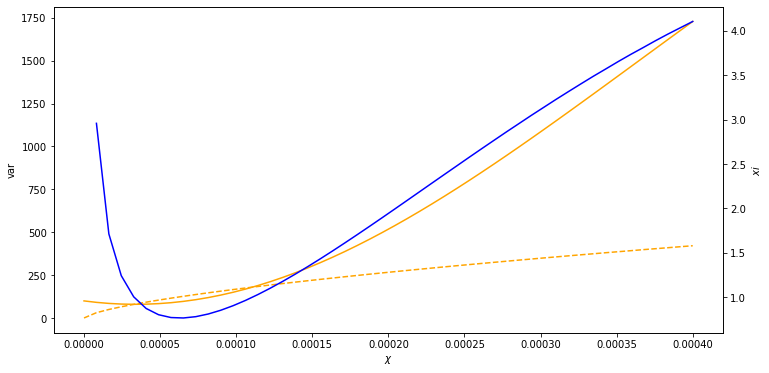

Miminal var of supperpossition =  79.6237363582073
Miminal var of borderstate =  0.0
0.76603132004299


/tmp/ipykernel_2353920/1532538769.py:22: RuntimeWarning: divide by zero encountered in true_divide
  print(np.min(var_testing_state[0]/var_border_state[0]))


In [29]:
# plt.figure(figsize=(8, 5))
# plt.plot(time_c, var_testing_state[0],time_c, var_border_state[0])

fig, ax1 = plt.subplots() 
  
ax1.set_xlabel('$\chi$') 
ax1.set_ylabel('var') 
ax1.plot(time_c, var_testing_state[0], time_c, var_border_state[0],'--', color = 'orange') 
  
# Adding Twin Axes

ax2 = ax1.twinx() 
  
ax2.set_ylabel('$xi$') 
ax2.plot(time_c, var_testing_state[0]/var_border_state[0], color = 'blue') 
plt.show()
plt.rcParams['figure.figsize'] = 12, 6
fig.savefig("min_chi.svg")

print("Miminal var of supperpossition = ", min(var_testing_state[0]))
print("Miminal var of borderstate = ", min(var_border_state[0]))
print(np.min(var_testing_state[0]/var_border_state[0]))

#### $N = 600$

In [15]:
N_a = 600 #size of the system
J = build_J(N_a/2) #definition of J operators
vacuum_state = q.basis(N_a + 1, 0) #vacuum state in collective spins, prepared in J_z axis

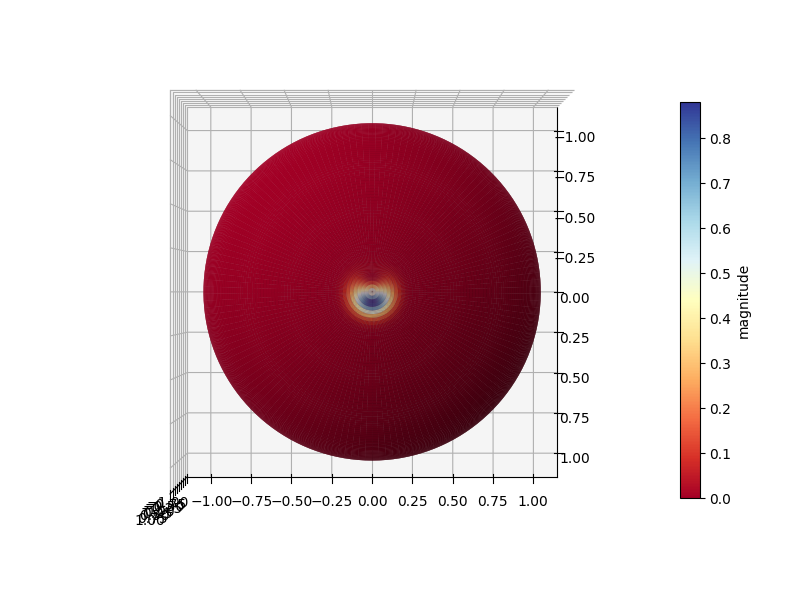

In [16]:
testing_superposition_state = 1/np.sqrt(2) * q.basis(N_a + 1, 0) + 1/np.sqrt(2) * q.basis(N_a + 1, 1)

QQ, THETA, PHI = q.spin_q_function(testing_superposition_state*testing_superposition_state.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(90,0)

/tmp/ipykernel_10208/2487647407.py:28: ComplexWarning: Casting complex values to real discards the imaginary part
  var_minimal[i] = Calc_variance_3(minimal_state, time_c[tt_c], J)
/tmp/ipykernel_10208/2487647407.py:36: ComplexWarning: Casting complex values to real discards the imaginary part
  var_testing_state[0][tt_c] = Calc_variance_3(testing_superposition_state_r, time_c[tt_c], J)


Code ran in 14126.9194 seconds


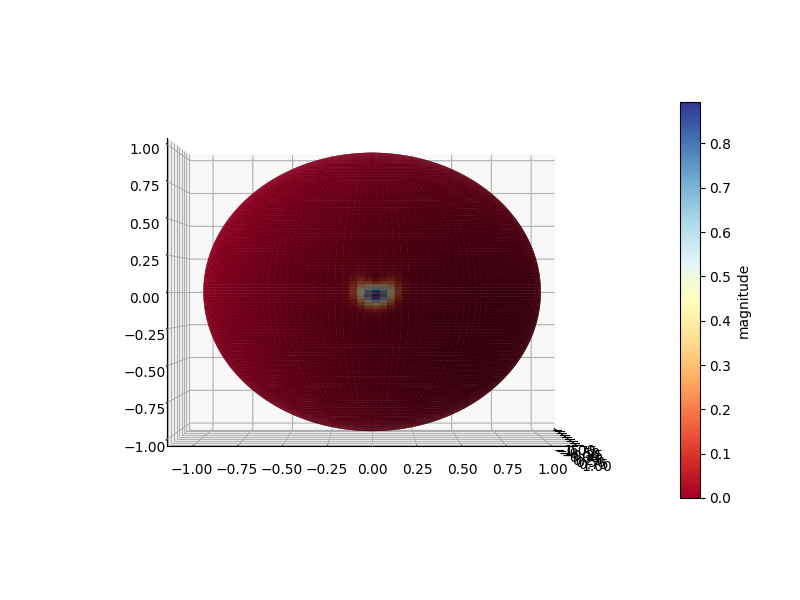

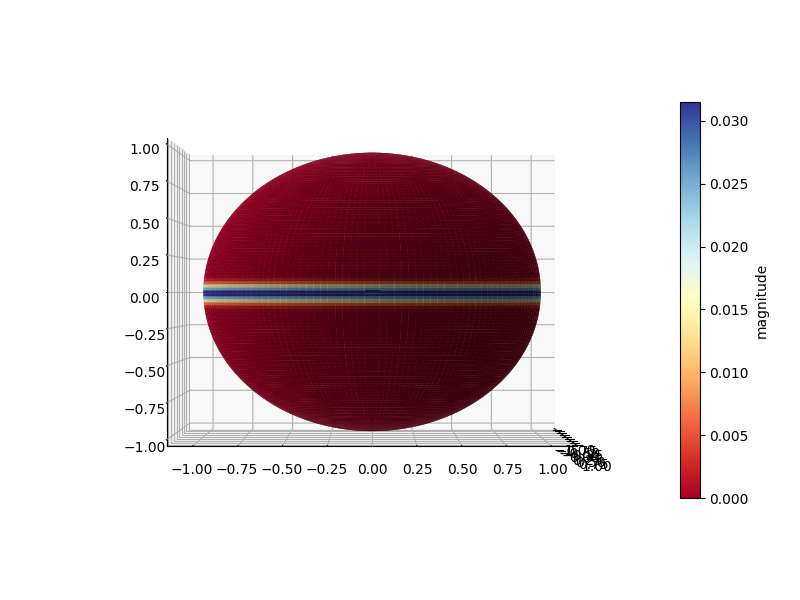

In [17]:
start_time = time.time()

testing_superposition_state_r = rotation_calibration(testing_superposition_state,J)
QQ, THETA, PHI = q.spin_q_function(testing_superposition_state_r*testing_superposition_state_r.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(0,0)


time_c = np.linspace(0,0.0001,50)
var_testing_state = np.zeros([1,50])
var_border_state = np.zeros([1,50])

number_of_testing_points = 100
alphas = np.linspace(0,1,number_of_testing_points)
epsilon = -10**-(9)
var_maximal = np.zeros([number_of_testing_points,1])

for tt_c in range(50):
    
    
    var_minimal = np.zeros([number_of_testing_points,1])
    for i in range(number_of_testing_points):    
        H = alphas[i] * J['z']**2 + (1 - alphas[i]) * J['y']**2 + epsilon * J['x']

        l, v = H.eigenstates()

        minimal_state = rotation_calibration(v[0], J)
        var_minimal[i] = Calc_variance_3(minimal_state, time_c[tt_c], J)    
    
    if tt_c == 0:
        
        QQ, THETA, PHI = q.spin_q_function(v[0]*v[0].dag(), phi, tau )
        fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
        ax.view_init(0,0)
                            
    var_testing_state[0][tt_c] = Calc_variance_3(testing_superposition_state_r, time_c[tt_c], J)
    var_border_state[0][tt_c] = min(min(var_minimal))
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Code ran in {elapsed_time:.4f} seconds")

/tmp/ipykernel_2353920/1532538769.py:15: RuntimeWarning: divide by zero encountered in true_divide
  ax2.plot(time_c, var_testing_state[0]/var_border_state[0], color = 'blue')


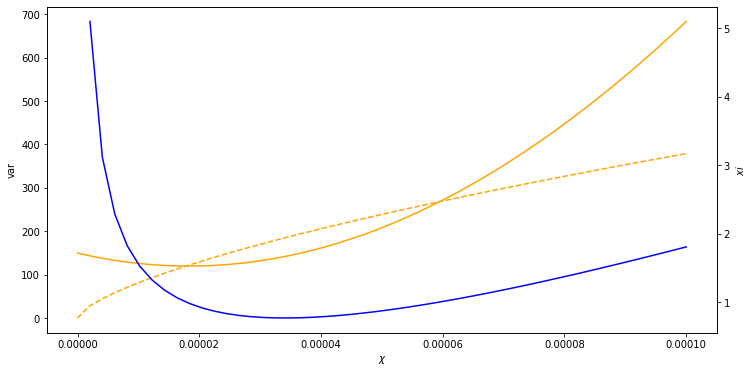

Miminal var of supperpossition =  119.6026380901323
Miminal var of borderstate =  0.0
0.7668873274862427


/tmp/ipykernel_2353920/1532538769.py:22: RuntimeWarning: divide by zero encountered in true_divide
  print(np.min(var_testing_state[0]/var_border_state[0]))


In [35]:
# plt.figure(figsize=(8, 5))
# plt.plot(time_c, var_testing_state[0],time_c, var_border_state[0])

fig, ax1 = plt.subplots() 
  
ax1.set_xlabel('$\chi$') 
ax1.set_ylabel('var') 
ax1.plot(time_c, var_testing_state[0], time_c, var_border_state[0],'--', color = 'orange') 
  
# Adding Twin Axes

ax2 = ax1.twinx() 
  
ax2.set_ylabel('$xi$') 
ax2.plot(time_c, var_testing_state[0]/var_border_state[0], color = 'blue') 
plt.show()
plt.rcParams['figure.figsize'] = 12, 6
fig.savefig("min_chi.svg")

print("Miminal var of supperpossition = ", min(var_testing_state[0]))
print("Miminal var of borderstate = ", min(var_border_state[0]))
print(np.min(var_testing_state[0]/var_border_state[0]))

In [136]:
119.6026380901323/0.7668873274862427

155.9585532364634

#### $N = \infty$

In [376]:
d = 200

A = q.destroy(d)

x = (A.dag() + A) / np.sqrt(2)
p = (1j * (A.dag() - A) / np.sqrt(2))

In [226]:
d = 200

A = q.destroy(d)

x = (A.dag() + A) / np.sqrt(2)
p = (1j * (A.dag() - A) / np.sqrt(2))

testing_state_HO = 1/np.sqrt(2) * q.fock(d,0) + 1/np.sqrt(2) * q.fock(d,1)

nonlinearity = np.linspace(0,1,50)
beta = np.linspace(0,1,50)

var = np.zeros([1,50])
var_G_i = np.zeros([1,50])
var_G = np.zeros([1,50])


for jdemenato in tqdm(range(50)):

    xi = nonlinearity[jdemenato]
    var_G_i = np.zeros([1,50])
    O = (1j * xi/3 * p**3).expm() * x * (-1j * xi/3 * p**3).expm()
    var[0][jdemenato] = np.array((testing_state_HO.dag() * O**2 * testing_state_HO) - (testing_state_HO.dag() * O * testing_state_HO)**2)[0][0].real

    for innerthing in range(50):
        H = beta[innerthing] * x**2 + (1-beta[innerthing]) * p**2
        l, v = H.eigenstates()
        var_G_i[0][innerthing] = np.array((v[0].dag() * O **2 * v[0]) - (v[0].dag() * O * v[0])**2 )[0][0].real
    
    var_G[0][jdemenato] = np.min(var_G_i)

100%|█████████████████████████████████████████| 50/50 [00:40<00:00,  1.25it/s]


In [252]:
np.where(np.min(var/var_G) == (var/var_G))[1][0]

26

In [477]:
np.min(var/var_G)

0.7697470657800306

In [381]:
O = (1j * 0.0003 *p**3).expm() * x * (-1j*0.0003 * p**3).expm()
# O = x +  p**2
l, v = O.eigenstates()

In [342]:
l[-50]

21.77826560404201

In [278]:
testing_HO_state = (-1j * 1/3 * p**3).expm() * q.fock(d,0)

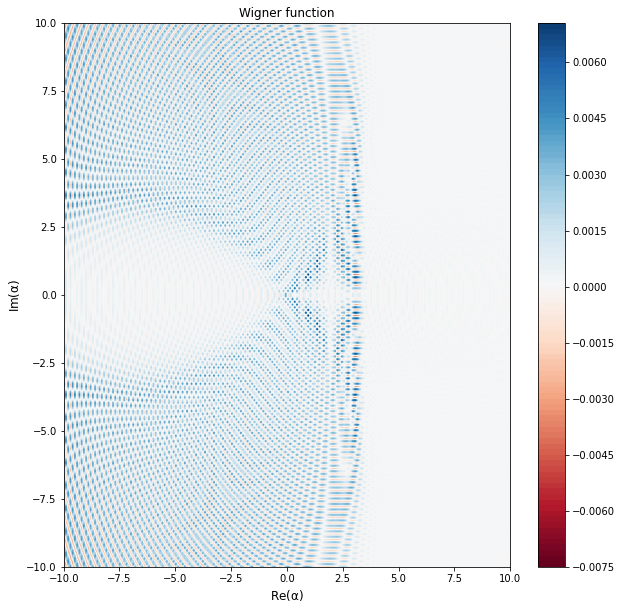

In [388]:
# samples = 200
# x_vec = np.linspace(-20, 20, samples)
# y_vec = np.linspace(-20, 20, samples)

# Q = ( q.wigner(v[-50],x_vec,y_vec))
q.plot_wigner(v[20], alpha_max=10, figsize=(10, 10), colorbar = True);

# fig, ax1 = plt.subplots(figsize=(10, 10), layout='constrained', sharey=True) 
# ax1.contourf(x_vec, y_vec, Q ,samples,)
# ax1.set_ylabel('$\hat{P}$')
# ax1.set_xlabel('$\hat{X}$')

### For $| \psi \rangle = \frac{1}{n} \left( \alpha |0\rangle + (1-\alpha)|1\rangle \right)$

In [8]:
start_time = time.time()

var_testing_state = np.zeros([1,100])

number_of_testing_points = 100
alphas = np.linspace(0,1,number_of_testing_points)
epsilon = -1 #-10**-(9)
var_minimal = np.zeros([number_of_testing_points,1])

# tt_c = 0.001
tt_c = 0.0007959183673469387

for i in range(number_of_testing_points):    
    H = alphas[i] * J['z']**2 + (1 - alphas[i]) * J['y']**2 + epsilon * J['x']

    l, v = H.eigenstates()

    minimal_state = rotation_calibration(v[0], J)
    var_minimal[i] = Calc_variance_3(minimal_state, tt_c, J)    
    
var_border_state = min(min(var_minimal))


alpha = np.linspace(0,1,100)
for a in range(100):
    
    # testing_superposition_state = (1/(np.sqrt(alpha[a]**2 + (1-alpha[a])**2))) * (alpha[a] * q.basis(N_a + 1, 0) + (1 - alpha[a]) * q.basis(N_a + 1, 1))
    testing_superposition_state =  (np.sqrt(alpha[a]) * q.basis(N_a + 1, 0) + np.sqrt(1 - alpha[a]) * q.basis(N_a + 1, 1))
    testing_superposition_state_r = rotation_calibration(testing_superposition_state,J)
    
    var_testing_state[0][a] = Calc_variance_3(testing_superposition_state_r, tt_c , J)

end_time = time.time()
elapsed_time = end_time - start_time

print(f"Code ran in {elapsed_time:.4f} seconds")

/tmp/ipykernel_738428/1870809537.py:19: ComplexWarning: Casting complex values to real discards the imaginary part
  var_minimal[i] = Calc_variance_3(minimal_state, tt_c, J)
/tmp/ipykernel_738428/1870809537.py:31: ComplexWarning: Casting complex values to real discards the imaginary part
  var_testing_state[0][a] = Calc_variance_3(testing_superposition_state_r, tt_c , J)


Code ran in 20.3153 seconds


In [245]:
%matplotlib inline

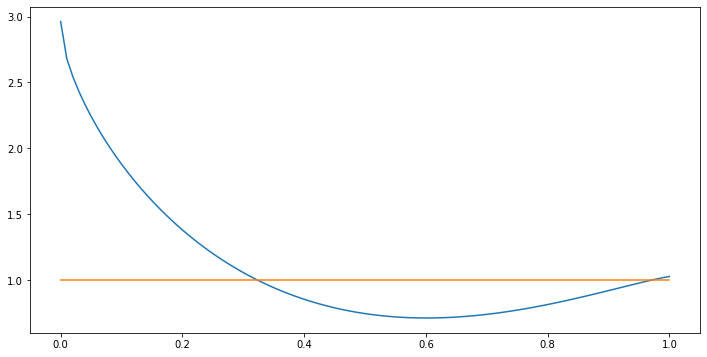

In [247]:
# fig, ax = plt.subplots()

plt.plot(alpha, (var_testing_state/var_border_state)[0],alpha,np.ones([1,100])[0])
plt.rcParams['figure.figsize'] = 12, 6
plt.savefig("min_state.svg")
# plt.show()


In [204]:
min(min(var_testing_state/var_border_state))

0.7146818819158854

In [205]:
10*np.log10(min(min(var_testing_state/var_border_state)))

-1.4588722767033426

In [206]:
min(min(var_testing_state/var_border_state))

0.7146818819158854

In [9]:
np.where((var_testing_state/var_border_state) == min(min(var_testing_state/var_border_state)))

(array([0]), array([29]))

In [10]:
alpha[27]

0.5510204081632653

In [11]:
t_c * 3 /((80/2)**(-3/2))

2.2768399153212333

In [ ]:
2.277* 

In [14]:
10 * np.log(0.7668474433455472)

-2.654673978603299

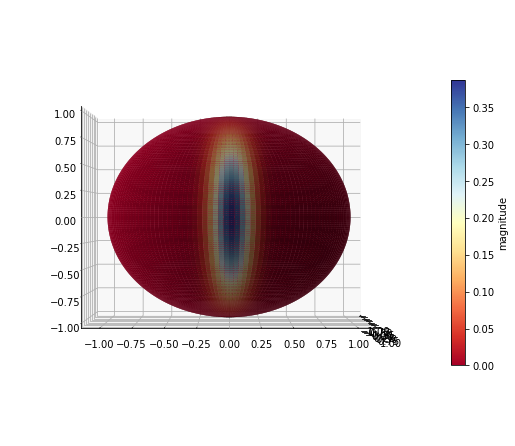

In [22]:
state_for_proof = (-1j * pi/2 * J['y']).expm() * (-1j * (J['y']*J['x'] + J['x']*J['y']) * 0.02).expm() * q.basis(N_a + 1, 0)

QQ, THETA, PHI = q.spin_q_function(state_for_proof*state_for_proof.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(0,0)

In [26]:
print((state_for_proof.dag() * J['y']**2 * state_for_proof) - (state_for_proof.dag() * J['y'] * state_for_proof)**2)
print((state_for_proof.dag() * J['z']**2 * state_for_proof) - (state_for_proof.dag() * J['z'] * state_for_proof)**2)

Quantum object: dims = [[1], [1]], shape = (1, 1), type = bra
Qobj data =
[[0.94264677]]
Quantum object: dims = [[1], [1]], shape = (1, 1), type = bra
Qobj data =
[[356.67715075]]


In [31]:
angle = np.linspace(-pi/2,pi/2,20)
outout = np.zeros([20,1])

for cleh in range(20):
    ach = angle[cleh] 
    
    outout[cleh] = (state_for_proof.dag() * (-1j * ach * J['z']).expm() * J['y']**2 * (1j * ach * J['z']).expm() * state_for_proof) - (state_for_proof.dag()* (-1j * ach * J['z']).expm() * J['y'] * (1j * ach * J['z']).expm() * state_for_proof)**2

/tmp/ipykernel_151304/840723416.py:7: ComplexWarning: Casting complex values to real discards the imaginary part
  outout[cleh] = (state_for_proof.dag() * (-1j * ach * J['z']).expm() * J['y']**2 * (1j * ach * J['z']).expm() * state_for_proof) - (state_for_proof.dag()* (-1j * ach * J['z']).expm() * J['y'] * (1j * ach * J['z']).expm() * state_for_proof)**2


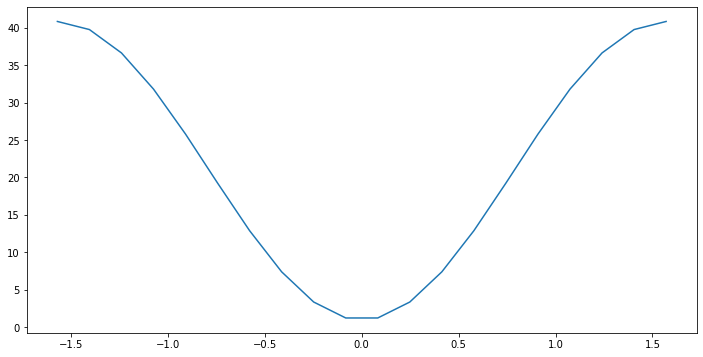

In [32]:
plt.plot(angle,outout)

In [68]:
stav = (1j * tt_c * J['z']**3).expm() * (-1j * J['y']*pi/2).expm() * q.basis(N_a+1, 0) 

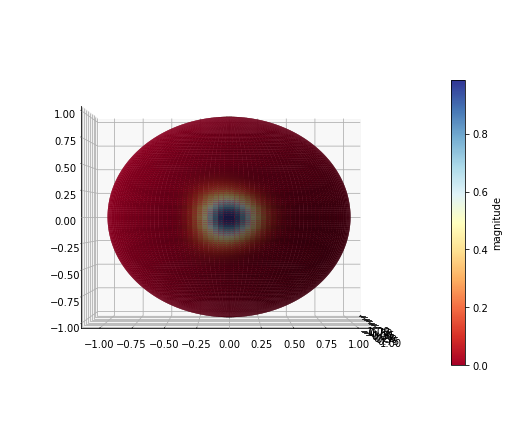

In [69]:
QQ, THETA, PHI = q.spin_q_function(stav*stav.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(0,0)

### For $| \psi \rangle =   \frac{1}{\sqrt{4}} |0\rangle + \frac{1}{\sqrt{4}}|1\rangle + \frac{1}{\sqrt{4}} |2\rangle + \frac{1}{\sqrt{4}} |3\rangle$

In [246]:
# Ns = [10,12,14,16,18,20,22,24,26,28,30,32,34,38,40,60,80,100,200,300,400,600]
# Ns = [4,6,8,10,12,14,16,18,20,24,30]#34,40,60,80,100,120,140,160,180,200,400,600]
Ns = [80]

Chci = np.zeros([1,np.size(Ns)])
Chce = np.zeros([1,np.size(Ns)])
G_Chci = np.zeros([1,np.size(Ns)])
G_Chce = np.zeros([1,np.size(Ns)])
over_all = np.zeros([1,np.size(Ns)])

number_of_testing_points = 50

for itter in tqdm(range(np.size(Ns))):
    
    N_a = Ns[itter] #size of the system
    time_c = np.linspace(0,5.5/3 * (N_a)**(-3/2),50)
    
    J = build_J(N_a/2) #definition of J operators
    vacuum_state = q.basis(N_a + 1, 0) #vacuum state in collective spins, prepared in J_z axis

    testing_superposition_state = 1/np.sqrt(4) * q.basis(N_a + 1, 0) + 1/np.sqrt(4) * q.basis(N_a + 1, 1) + 1/np.sqrt(4) * q.basis(N_a + 1, 2) + 1/np.sqrt(4) * q.basis(N_a + 1, 3)

    number_of_testing_points = 50
    
    alphas = np.linspace(0.1,0.9,number_of_testing_points)
    epsilon = -10**-(9)
    var_maximal = np.zeros([number_of_testing_points,1])

    testing_superposition_state_r = rotation_calibration(testing_superposition_state,J)

    var_testing_state = np.zeros([1,50])
    var_border_state = np.zeros([1,50])

    for tt_c in range(50):
        var_minimal = np.zeros([number_of_testing_points,1])
    
        for i in range(number_of_testing_points):    
            H = alphas[i] * J['z']**2 + (1 - alphas[i]) * J['y']**2 + epsilon * J['x']
        
            l, v = H.eigenstates()
        
            minimal_state = rotation_calibration(v[0], J)
            var_minimal[i] = Calc_variance_3(minimal_state, time_c[tt_c], J)    
                                
        var_testing_state[0][tt_c] = Calc_variance_3(testing_superposition_state_r, time_c[tt_c], J)
        var_border_state[0][tt_c] = min(min(var_minimal))

    Chci[0][itter] = np.min(var_testing_state[0]) 
    Chce[0][itter] = var_border_state[0][np.where (np.min(var_testing_state[0]) == var_testing_state[0] )[0]]
    G_Chci[0][itter] = var_testing_state[0][np.where(np.min(var_testing_state/var_border_state)== var_testing_state/var_border_state)[1][0]]
    G_Chce[0][itter] = var_border_state[0][np.where(np.min(var_testing_state/var_border_state)== var_testing_state/var_border_state)[1][0]]
    over_all[0][itter] = np.min(var_testing_state/var_border_state)

  0%|                                                   | 0/1 [00:00<?, ?it/s]/tmp/ipykernel_2353920/1722843634.py:43: ComplexWarning: Casting complex values to real discards the imaginary part
  var_minimal[i] = Calc_variance_3(minimal_state, time_c[tt_c], J)
/tmp/ipykernel_2353920/1722843634.py:45: ComplexWarning: Casting complex values to real discards the imaginary part
  var_testing_state[0][tt_c] = Calc_variance_3(testing_superposition_state_r, time_c[tt_c], J)
100%|██████████████████████████████████████████| 1/1 [04:31<00:00, 272.00s/it]


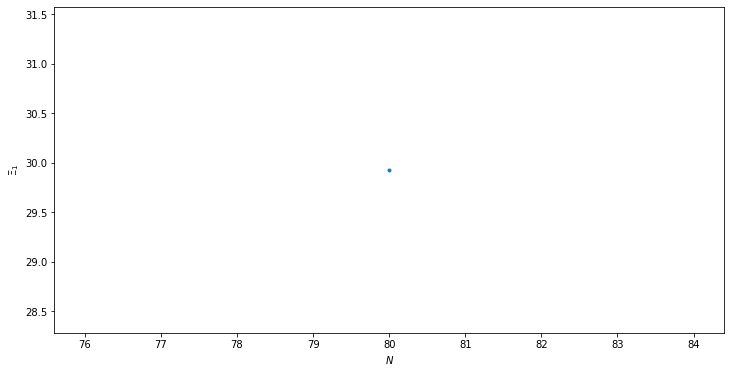

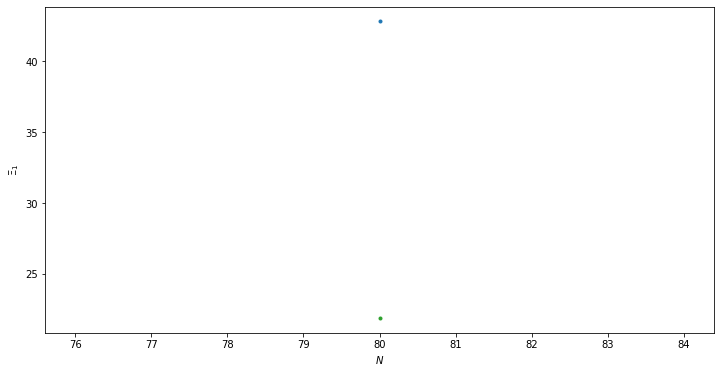

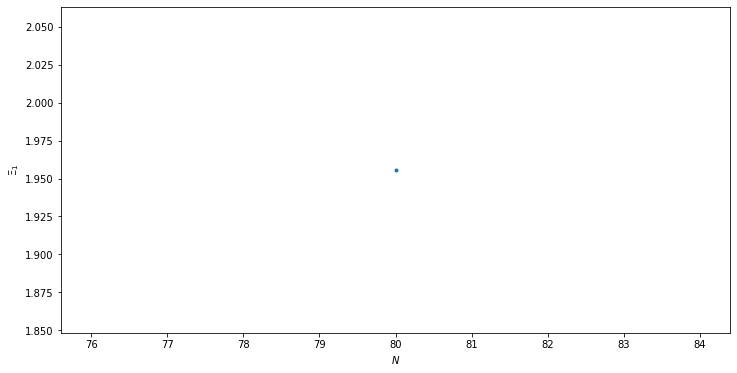

In [247]:
fig, ax = plt.subplots()

ax.plot(Ns,Chci[0],'.',Ns,Chci[0])#,Ns, Chce[0],'.',Ns, Chce[0])
ax.set_xlabel('$N$')
ax.set_ylabel('$\Xi _1$');
plt.savefig("test_dimensions.svg")

fig, ax = plt.subplots()

ax.plot(Ns,G_Chci[0],'.',Ns,G_Chci[0],Ns, G_Chce[0],'.',Ns, G_Chce[0])
ax.set_xlabel('$N$')
ax.set_ylabel('$\Xi _1$');
# plt.savefig("test_dimensions.svg")

fig, ax = plt.subplots()

ax.plot(Ns,over_all[0],'.',Ns,over_all[0])
ax.set_xlabel('$N$')
ax.set_ylabel('$\Xi _1$');

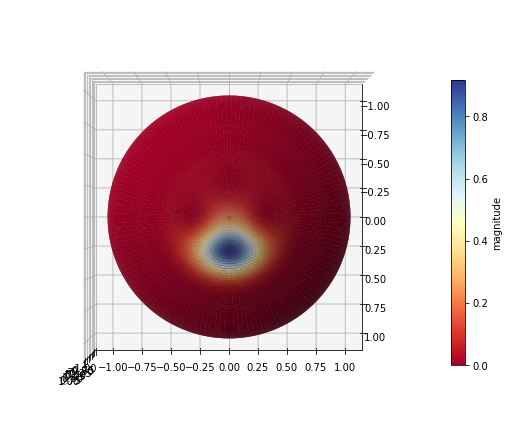

In [249]:
QQ, THETA, PHI = q.spin_q_function(testing_superposition_state*testing_superposition_state.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(90,0)

### Small numbers

In [584]:
N_a = 20#size of the system
time_c = ttt[0][N_a-1]
# time_c = ttt[0][-4]

J = build_J(N_a/2) #definition of J operators
vacuum_state = (N_a + 1, 0) #vacuum state in collective spins, prepared in J_z axis

testing_superposition_state = 1/np.sqrt(2) * q.basis(N_a + 1, 0) + 1/np.sqrt(2) * q.basis(N_a + 1, 1)

number_of_testing_points = 10000
alphas = np.linspace(0.01,5,number_of_testing_points)
epsilon = (-4/N_a) #* -1#-10**-(3)
var_maximal = np.zeros([number_of_testing_points,1])

testing_superposition_state_r = rotation_calibration(testing_superposition_state,J)

# var_testing_state = np.zeros([1,50])
# var_border_state = np.zeros([1,50])

var_minimal = np.zeros([number_of_testing_points,1])

for i in range(number_of_testing_points):  
    g = alphas[i]
    # H = alphas[i] * J['z']**2 + (1 - alphas[i]) * J['y']**2 + (alphas[i]) * J['x'] #epsilon * J['x']
    H = (g**2)/(1 + g**2) * J['z']**2 +  1/(1 + g**2) * J['y']**2 - g/(1 + g**2) * J['x'] #epsilon * J['x']

    l, v = H.eigenstates()

    # minimal_state = rotation_calibration(v[0], J)
    # var_minimal[i] = Calc_variance_3(minimal_state, time_c[tt_c], J)    
    var_minimal[i] = Calc_variance_3(rotation_calibration(v[0],J), time_c, J)
                        
var_testing_state = Calc_variance_3(testing_superposition_state_r, time_c, J)
var_border_state = min(min(var_minimal))

/tmp/ipykernel_9764/2727815076.py:31: ComplexWarning: Casting complex values to real discards the imaginary part
  var_minimal[i] = Calc_variance_3(rotation_calibration(v[0],J), time_c, J)


In [585]:
par_a = alphas[np.where(var_minimal == np.min(var_minimal))[0][0]]
# par_a = 1
g = par_a
# H = par_a * J['z']**2 + (1 - par_a) * J['y']**2 + (-par_a) * J['x']#(0.310416280780121 * epsilon)* J['x']
H = (g**2)/(1 + g**2) * J['z']**2 +  1/(1 + g**2) * J['y']**2 - g/(1 + g**2) * J['x'] 
l, v = H.eigenstates()

v_bra = v[0].dag()
v_ket = v[0]


H1 = v_bra * J['z']**2 * v_ket
H2 = v_bra * J['y']**2 * v_ket
H3 = v_bra * J['x'] * v_ket

HH = v_bra * H  * v_ket

print(H1)
print(H2)
print(H3)
print('\n')
print(H1+H2-H3)
print('\n')
print(H1+H2)
print('\n')
print(HH)
print('\n')
print(par_a)

Quantum object: dims = [[1], [1]], shape = (1, 1), type = bra
Qobj data =
[[5.61080999]]
Quantum object: dims = [[1], [1]], shape = (1, 1), type = bra
Qobj data =
[[4.45254672]]
Quantum object: dims = [[1], [1]], shape = (1, 1), type = bra
Qobj data =
[[9.9964781]]


Quantum object: dims = [[1], [1]], shape = (1, 1), type = bra
Qobj data =
[[0.06687861]]


Quantum object: dims = [[1], [1]], shape = (1, 1), type = bra
Qobj data =
[[10.06335671]]


Quantum object: dims = [[1], [1]], shape = (1, 1), type = bra
Qobj data =
[[0.]]


0.8908230823082309


In [586]:
print(var_testing_state.real)
print(var_border_state)
print(var_testing_state.real/var_border_state)

7.936103917653469
11.497611060668515
0.6902393789264284


Text(0.5, 0.92, 'Vlastní stav H')

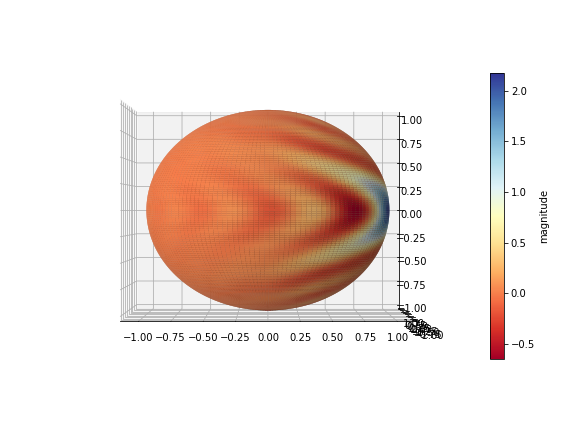

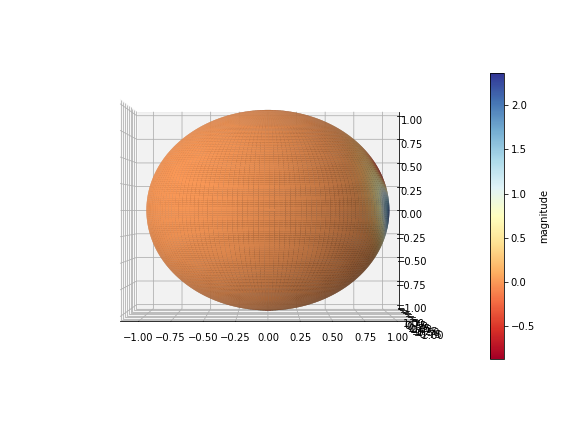

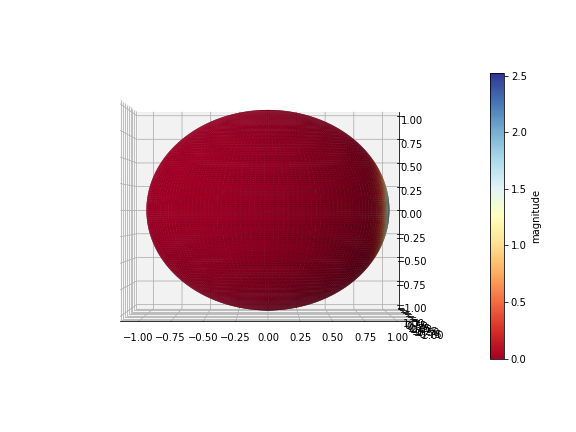

In [587]:
O13 = (1j * time_c * J['z']**3).expm() * (-J['x']) * (-1j * time_c * J['z']**3).expm()  
# O13 = J['y']
aha = O13.eigenstates()
st = aha[1][0]
# test =  1/np.sqrt(2) * q.basis(N_a + 1, 0) + 1/np.sqrt(2) * q.basis(N_a + 1, 1)
test = testing_superposition_state_r
# koh = (-1j * pi/4 * J['z']).expm() * (1j * pi/2 * J['y']).expm() * q.basis(N_a + 1, 0)
koh = rotation_calibration(v[0],J)



QQ, THETA, PHI = q.spin_wigner(st *st.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(00,-90)
ax.set_title('Vlastní stav O')


QQ, THETA, PHI = q.spin_wigner(test *test.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(00,-90)
ax.set_title('Testovací stav')


QQ, THETA, PHI = q.spin_wigner(koh * koh.dag(), phi, tau )
fig, ax = q.plot_spin_distribution_3d(QQ, THETA, PHI)
ax.view_init(00,-90)
ax.set_title('Vlastní stav H')